In [1]:
import pandas as pd
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Dense,Dropout,Flatten
from keras.layers import Conv2D,MaxPooling2D
from keras.optimizers import Adam
import os
import numpy as np
from sklearn.model_selection import train_test_split

In [2]:

df = pd.read_csv('/content/fer2013.csv')
df

,emotion,pixels,Usage
0,0,70 80 82 72 58 58 60 63 54 58 60 48 89 115 121...,Training
1,0,151 150 147 155 148 133 111 140 170 174 182 15...,Training
2,2,231 212 156 164 174 138 161 173 182 200 106 38...,Training
3,4,24 32 36 30 32 23 19 20 30 41 21 22 32 34 21 1...,Training
4,6,4 0 0 0 0 0 0 0 0 0 0 0 3 15 23 28 48 50 58 84...,Training
...,...,...,...
35882,6,50 36 17 22 23 29 33 39 34 37 37 37 39 43 48 5...,PrivateTest
35883,3,178 174 172 173 181 188 191 194 196 199 200 20...,PrivateTest
35884,0,17 17 16 23 28 22 19 17 25 26 20 24 31 19 27 9...,PrivateTest
35885,3,30 28 28 29 31 30 42 68 79 81 77 67 67 71 63 6...,PrivateTest


In [3]:
x = df['pixels']
#x = df['pixels'].apply(pd.to_numeric, errors='coerce').astype(np.float64)
x


0        70 80 82 72 58 58 60 63 54 58 60 48 89 115 121...
1        151 150 147 155 148 133 111 140 170 174 182 15...
2        231 212 156 164 174 138 161 173 182 200 106 38...
3        24 32 36 30 32 23 19 20 30 41 21 22 32 34 21 1...
4        4 0 0 0 0 0 0 0 0 0 0 0 3 15 23 28 48 50 58 84...
                               ...                        
35882    50 36 17 22 23 29 33 39 34 37 37 37 39 43 48 5...
35883    178 174 172 173 181 188 191 194 196 199 200 20...
35884    17 17 16 23 28 22 19 17 25 26 20 24 31 19 27 9...
35885    30 28 28 29 31 30 42 68 79 81 77 67 67 71 63 6...
35886    19 13 14 12 13 16 21 33 50 57 71 84 97 108 122...
Name: pixels, Length: 35887, dtype: object

In [4]:
y = df['emotion']
y

0        0
1        0
2        2
3        4
4        6
        ..
35882    6
35883    3
35884    0
35885    3
35886    2
Name: emotion, Length: 35887, dtype: int64

In [5]:
xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.25,random_state=42)

In [6]:
xtrain

24163    250 250 249 255 136 56 68 62 57 61 77 88 99 13...
18797    122 122 124 127 129 124 130 121 113 76 38 32 3...
22145    43 47 60 115 141 160 167 170 183 188 192 196 2...
25645    23 28 26 24 30 43 33 22 31 49 66 82 93 98 118 ...
31941    129 87 178 108 103 136 119 58 51 55 116 208 22...
                               ...                        
16850    214 203 195 116 27 107 142 162 176 185 193 191...
6265     69 78 90 96 99 82 77 66 58 82 103 80 69 77 85 ...
11284    97 93 61 40 56 32 40 48 22 23 42 25 13 14 27 1...
860      254 228 216 203 189 182 162 152 147 151 145 15...
15795    119 101 18 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0...
Name: pixels, Length: 26915, dtype: object

In [7]:
ytrain

24163    5
18797    2
22145    5
25645    3
31941    4
        ..
16850    2
6265     4
11284    4
860      0
15795    4
Name: emotion, Length: 26915, dtype: int64

In [8]:
xtest

19098    142 148 152 158 163 163 166 167 167 167 167 16...
2043     60 63 54 45 48 45 38 38 43 41 34 34 40 72 102 ...
16564    133 46 31 37 41 42 57 48 51 83 72 51 60 46 64 ...
10650    0 0 0 0 0 0 0 0 0 0 0 1 0 1 24 80 108 108 109 ...
4955     255 254 255 224 102 64 56 83 82 72 72 72 73 61...
                               ...                        
21846    76 80 91 95 100 103 106 110 113 122 135 140 14...
35026    97 135 145 152 160 195 164 134 102 76 56 50 41...
13271    53 62 105 133 155 171 177 181 186 187 186 188 ...
10373    255 254 253 255 214 193 191 193 166 128 166 18...
32459    28 23 25 28 27 29 36 44 49 30 56 72 68 60 69 6...
Name: pixels, Length: 8972, dtype: object

In [9]:
ytest

19098    3
2043     6
16564    0
10650    4
4955     0
        ..
21846    3
35026    5
13271    4
10373    0
32459    5
Name: emotion, Length: 8972, dtype: int64

In [10]:
import numpy as np

labels_dict = ['Angry','Disgust', 'Fear', 'Happy','Neutral','Sad','Surprise']
one_hot_labels = np.zeros((len(labels_dict), 7))

for i, label in enumerate(labels_dict):
    one_hot_labels[i, i] = 1

print(one_hot_labels)

[[1. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 1.]]


In [11]:
import numpy as np

pixel_values =df['pixels'].values  # 1D array of pixel values

#calculate the number of images
num_images=len(pixel_values)//(48*48)

# Reshape the pixel values considering the number of images
pixel_values_2d = pixel_values[:num_images * 48 * 48].reshape(-1, 48*48)

print(pixel_values_2d.shape)  # (num_images, 48, 48)

(15, 2304)


In [14]:
training = df.loc[df["Usage"] == "Training"]
public_test = df.loc[df["Usage"] == "PublicTest"]
private_test = df.loc[df["Usage"] == "PrivateTest"]

print("Train = ", training.shape)
print("Test public = ", public_test.shape)
print("Test private = ", private_test.shape)

Train =  (28709, 3)
Test public =  (3589, 3)
Test private =  (3589, 3)


In [12]:
# Assuming the csv file has a column named 'Usage' that indicates whether the sample is for training or testing
Training = df[df['Usage'] == 'Training']
PrivateTest = df[df['Usage'] == 'PrivateTest']
PublicTest=df[df['Usage']=='PublicTest']
# Get the number of train images
num_train_images = len(Training)

# Get the number of test images
num_test_Private_images = len(PrivateTest)
num_test_Public_images = len(PublicTest)


# Get the total number of images
total_images = num_train_images + num_test_Private_images +  num_test_Public_images

print(f"Number of train images: {num_train_images}")
print(f"Number of test images: {num_test_Private_images}")
print(f"Number of test images: {num_test_Public_images}")

print(f"Total number of images: {total_images}")

Number of train images: 28709
Number of test images: 3589
Number of test images: 3589
Total number of images: 35887


In [15]:
print("========================= Emotion Data ===========================")
print("train_data = \n{}, \npublic_data = \n{}, \nprivate_data = \n{}".format(training["emotion"].value_counts(),
      public_test["emotion"].value_counts(), private_test["emotion"].value_counts()))

========================= Emotion Data ===========================
train_data = 
emotion
3    7215
6    4965
4    4830
2    4097
0    3995
5    3171
1     436
Name: count, dtype: int64, 
public_data = 
emotion
3    895
4    653
6    607
2    496
0    467
5    415
1     56
Name: count, dtype: int64, 
private_data = 
emotion
3    879
6    626
4    594
2    528
0    491
5    416
1     55
Name: count, dtype: int64


In [16]:
from keras.utils import to_categorical
train_labels = training["emotion"]
train_labels = to_categorical(train_labels)

train_pixels = training["pixels"].str.split(" ").tolist()
train_pixels = np.float64(train_pixels)
train_pixels = train_pixels.reshape((28709,48, 48, 1))
train_pixels = train_pixels.astype("float64") / 255

private_labels = private_test["emotion"]
private_labels = to_categorical(private_labels)

private_pixels = private_test["pixels"].str.split(" ").tolist()
private_pixels = np.float64(private_pixels)
private_pixels = private_pixels.reshape((3589,48, 48, 1))
private_pixels = private_pixels.astype("float64") / 255
public_labels = public_test["emotion"]
public_labels = to_categorical(public_labels)

public_pixels = public_test["pixels"].str.split(" ").tolist()
public_pixels = np.float64(public_pixels)
public_pixels = public_pixels.reshape((3589,48, 48, 1))
public_pixels = public_pixels.astype("float64") / 255

In [17]:
print(pixel_values_2d.dtype)

object


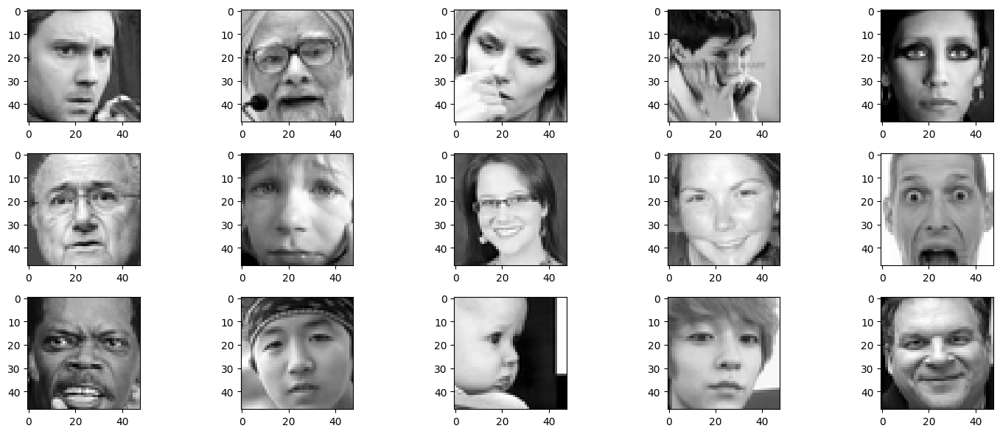

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming pixel_values_2d is the same as train_pixels
pixel_values_2d = pixel_values

# Convert pixel values to numpy array of floats
pixel_values_2d_float = np.array([np.array(x.split(), dtype=np.float64) for x in pixel_values_2d])

# Normalize pixel values
pixel_values_norm = (pixel_values_2d_float - np.min(pixel_values_2d_float)) / (np.max(pixel_values_2d_float) - np.min(pixel_values_2d_float))

plt.figure(0, figsize=(15,6))
for i in range(15):
    plt.subplot(3,5,i+1)
    img = np.array(pixel_values_2d[i].split(),dtype=np.uint8).reshape(48, 48)  # Convert to uint8 and reshape to 48x48 image
    plt.imshow(img, cmap="gray")

plt.tight_layout()
plt.show()

In [19]:
pixel_values_2d_float = pixel_values_2d_float / 255.0
print(np.min(pixel_values_2d_float), np.max(pixel_values_2d_float))

0.0 1.0


In [20]:
labels_dict=['Angry','Disgust', 'Fear', 'Happy','Neutral','Sad','Surprise']

In [21]:
model = Sequential()

model.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(48,48,1)))

model.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.1))

model.add(Conv2D(128, kernel_size=(3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.1))

model.add(Conv2D(256, kernel_size=(3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.1))

model.add(Flatten())
model.add(Dense(512, activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(7, activation='softmax'))

print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 46, 46, 32)        320       
                                                                 
 conv2d_1 (Conv2D)           (None, 44, 44, 64)        18496     
                                                                 
 max_pooling2d (MaxPooling2  (None, 22, 22, 64)        0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 22, 22, 64)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 20, 20, 128)       73856     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 10, 10, 128)       0         
 g2D)                                                   

In [23]:
model.compile(optimizer = 'adam', loss='categorical_crossentropy', metrics=['accuracy'])

hist = model.fit(train_pixels, train_labels, batch_size = 256, epochs = 30 ,
                validation_data = (private_pixels, private_labels))
#hist = model.fit(train_pixels, train_labels, batch_size=128, epochs=2,
                 #validation_data=[(private_pixels, private_labels), (public_pixels, public_labels)])

Epoch 1/30
113/113 [==============================] - 31s 262ms/step - loss: 1.7195 - accuracy: 0.3015 - val_loss: 1.6044 - val_accuracy: 0.3594
Epoch 2/30
113/113 [==============================] - 29s 260ms/step - loss: 1.5047 - accuracy: 0.4189 - val_loss: 1.4552 - val_accuracy: 0.4246
Epoch 3/30
113/113 [==============================] - 30s 261ms/step - loss: 1.3406 - accuracy: 0.4845 - val_loss: 1.2923 - val_accuracy: 0.5063
Epoch 4/30
113/113 [==============================] - 29s 260ms/step - loss: 1.2346 - accuracy: 0.5323 - val_loss: 1.2033 - val_accuracy: 0.5414
Epoch 5/30
113/113 [==============================] - 29s 258ms/step - loss: 1.1610 - accuracy: 0.5606 - val_loss: 1.1522 - val_accuracy: 0.5595
Epoch 6/30
113/113 [==============================] - 29s 260ms/step - loss: 1.0989 - accuracy: 0.5887 - val_loss: 1.1223 - val_accuracy: 0.5782
Epoch 7/30
113/113 [==============================] - 30s 262ms/step - loss: 1.0370 - accuracy: 0.6103 - val_loss: 1.1342 - val_ac

In [24]:
model.compile(optimizer = 'adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [25]:
model.save('model_file.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [26]:
from keras.models import load_model
model=load_model('/content/model_file.h5')

In [27]:
# Evaluate the model on the public test data
public_test_loss, public_test_acc = model.evaluate(public_pixels, public_labels)
print(f'Public test accuracy: {public_test_acc:.3f}')

113/113 [==============================] - 1s 11ms/step - loss: 1.9152 - accuracy: 0.6021
Public test accuracy: 0.602


In [28]:
# Evaluate the model on the training data
train_loss, train_acc = model.evaluate(train_pixels, train_labels)
print(f'Train accuracy: {train_acc:.3f}')

898/898 [==============================] - 9s 10ms/step - loss: 0.0574 - accuracy: 0.9885
Train accuracy: 0.988


In [29]:
# Evaluate the model on the private test data
private_test_loss, private_test_acc = model.evaluate(private_pixels, private_labels)
print(f'Private test accuracy: {private_test_acc:.3f}')

113/113 [==============================] - 1s 10ms/step - loss: 1.7944 - accuracy: 0.6108
Private test accuracy: 0.611


In [30]:
# Evaluate the model on the training data
train_loss, train_acc = model.evaluate(train_pixels, train_labels, verbose=0)

# Evaluate the model on the private test data
private_test_loss, private_test_acc = model.evaluate(private_pixels, private_labels, verbose=0)

# Evaluate the model on the public test data
public_test_loss, public_test_acc = model.evaluate(public_pixels, public_labels, verbose=0)

# Calculate the overall accuracy
overall_acc = (train_acc * len(train_labels) + private_test_acc * len(private_labels) + public_test_acc * len(public_labels)) / (len(train_labels) + len(private_labels) + len(public_labels))

print(f'Overall accuracy: {overall_acc:.2f}')

Overall accuracy: 0.91


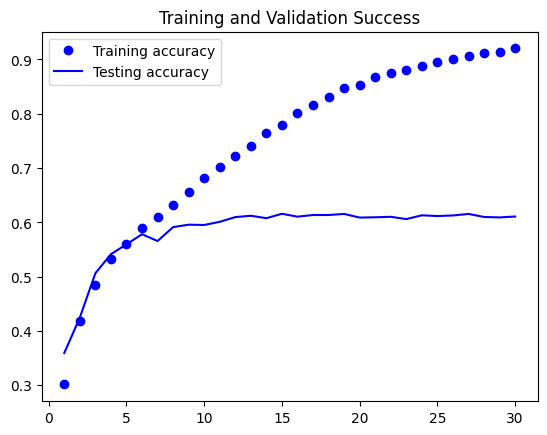

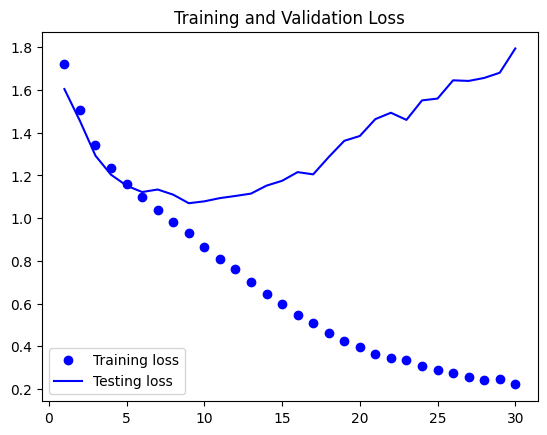

In [31]:
acc = hist.history["accuracy"]
val_acc = hist.history["val_accuracy"]
loss = hist.history["loss"]
val_loss = hist.history["val_loss"]

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, "bo", label = "Training accuracy")
plt.plot(epochs, val_acc, "b", label = "Testing accuracy")
plt.title("Training and Validation Success")
plt.legend()

plt.figure()

plt.plot(epochs, loss, "bo", label = "Training loss")
plt.plot(epochs, val_loss, "b", label = "Testing loss")
plt.title("Training and Validation Loss")
plt.legend()


plt.show()

In [33]:
import matplotlib.pyplot as plt

img = plt.imread("/content/myimage.jpeg")
if img is None:
    print("Error: Unable to read image file")
else:
    print("Image read successfully")

Image read successfully


1/1 [==============================] - 0s 115ms/step
Label: Happy (3)


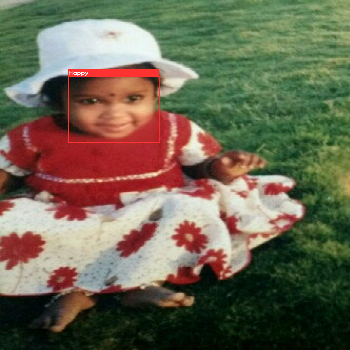

In [35]:
import cv2
from google.colab.patches import cv2_imshow
model=load_model('model_file.h5')
faceDetect=cv2.CascadeClassifier('haarcascade_frontalface_default.xml')

labels_dict={0:'Angry',1:'Disgust', 2:'Fear', 3:'Happy',4:'Neutral',5:'Sad',6:'Surprise'}

# len(number_of_image), image_height, image_width, channel

frame=cv2.imread("/content/myimage.jpeg")
gray = cv2.cvtColor(frame,cv2.COLOR_BGR2GRAY )
faces= faceDetect.detectMultiScale(gray, 1.3, 3)
for x,y,w,h in faces:
    sub_face_img=gray[y:y+h, x:x+w]
    resized=cv2.resize(sub_face_img,(48,48))
    normalize=resized/255.0
    reshaped=np.reshape(normalize, (1, 48, 48, 1))
    result=model.predict(reshaped)
    label=np.argmax(result, axis=1)[0]
    label_name = labels_dict[label]  # Get the label name from the dictionary
    print(f"Label: {label_name} ({label})")  # Print the label name and index

    cv2.rectangle(frame, (x,y), (x+w, y+h), (0,0,255), 1)
    cv2.rectangle(frame,(x,y),(x+w,y+h),(50,50,255),2)
    cv2.rectangle(frame,(x,y-40),(x+w,y),(50,50,255),-1)
    cv2.putText(frame, labels_dict[label], (x, y-10),cv2.FONT_HERSHEY_SIMPLEX,0.8,(255,255,255),2)

# Display the output image with a limited size
output_width = 350  # Adjust the width as needed
output_height = 350
resized_frame = cv2.resize(frame, (output_width, output_height))
cv2_imshow(resized_frame)

cv2.waitKey(0)
cv2.destroyAllWindows()

1/1 [==============================] - 0s 84ms/step
Label: Fear (2)


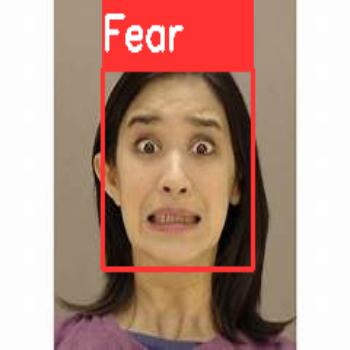

In [36]:
import cv2
from google.colab.patches import cv2_imshow
model=load_model('model_file.h5')
faceDetect=cv2.CascadeClassifier('haarcascade_frontalface_default.xml')

labels_dict={0:'Angry',1:'Disgust', 2:'Fear', 3:'Happy',4:'Neutral',5:'Sad',6:'Surprise'}

# len(number_of_image), image_height, image_width, channel

frame=cv2.imread("/content/fear3.jpg")
gray = cv2.cvtColor(frame,cv2.COLOR_BGR2GRAY )
faces= faceDetect.detectMultiScale(gray, 1.3, 3)
for x,y,w,h in faces:
    sub_face_img=gray[y:y+h, x:x+w]
    resized=cv2.resize(sub_face_img,(48,48))
    normalize=resized/255.0
    reshaped=np.reshape(normalize, (1, 48, 48, 1))
    result=model.predict(reshaped)
    label=np.argmax(result, axis=1)[0]
    label_name = labels_dict[label]  # Get the label name from the dictionary
    print(f"Label: {label_name} ({label})")  # Print the label name and index

    cv2.rectangle(frame, (x,y), (x+w, y+h), (0,0,255), 1)
    cv2.rectangle(frame,(x,y),(x+w,y+h),(50,50,255),2)
    cv2.rectangle(frame,(x,y-40),(x+w,y),(50,50,255),-1)
    cv2.putText(frame, labels_dict[label], (x, y-10),cv2.FONT_HERSHEY_SIMPLEX,0.8,(255,255,255),2)
# Display the output image with a limited size
output_width = 350  # Adjust the width as needed
output_height = 350  # Adjust the height as needed
resized_frame = cv2.resize(frame, (output_width, output_height))
cv2_imshow(resized_frame)
cv2.waitKey(0)
cv2.destroyAllWindows()

1/1 [==============================] - 0s 86ms/step
Label: Angry (0)


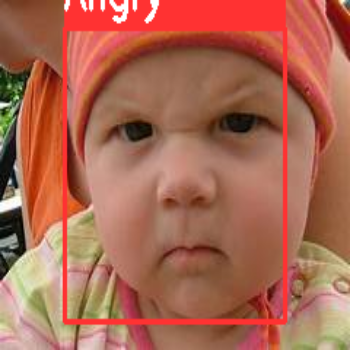

In [37]:
import cv2
from google.colab.patches import cv2_imshow
model=load_model('model_file.h5')
faceDetect=cv2.CascadeClassifier('haarcascade_frontalface_default.xml')

labels_dict={0:'Angry',1:'Disgust', 2:'Fear', 3:'Happy',4:'Neutral',5:'Sad',6:'Surprise'}

# len(number_of_image), image_height, image_width, channel

frame=cv2.imread("/content/angry1.jpg")
gray = cv2.cvtColor(frame,cv2.COLOR_BGR2GRAY )
faces= faceDetect.detectMultiScale(gray, 1.3, 3)
for x,y,w,h in faces:
    sub_face_img=gray[y:y+h, x:x+w]
    resized=cv2.resize(sub_face_img,(48,48))
    normalize=resized/255.0
    reshaped=np.reshape(normalize, (1, 48, 48, 1))
    result=model.predict(reshaped)
    label=np.argmax(result, axis=1)[0]
    label_name = labels_dict[label]  # Get the label name from the dictionary
    print(f"Label: {label_name} ({label})")  # Print the label name and index

    cv2.rectangle(frame, (x,y), (x+w, y+h), (0,0,255), 1)
    cv2.rectangle(frame,(x,y),(x+w,y+h),(50,50,255),2)
    cv2.rectangle(frame,(x,y-40),(x+w,y),(50,50,255),-1)
    cv2.putText(frame, labels_dict[label], (x, y-10),cv2.FONT_HERSHEY_SIMPLEX,0.8,(255,255,255),2)
# Display the output image with a limited size
output_width = 350  # Adjust the width as needed
output_height = 350  # Adjust the height as needed
resized_frame = cv2.resize(frame, (output_width, output_height))
cv2_imshow(resized_frame)

cv2.waitKey(0)
cv2.destroyAllWindows()

1/1 [==============================] - 0s 89ms/step
Label: Disgust (1)


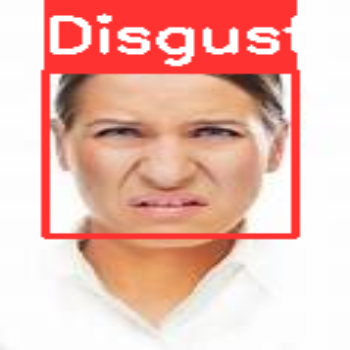

In [38]:
import cv2
from google.colab.patches import cv2_imshow
model=load_model('model_file.h5')
faceDetect=cv2.CascadeClassifier('haarcascade_frontalface_default.xml')

labels_dict={0:'Angry',1:'Disgust', 2:'Fear', 3:'Happy',4:'Neutral',5:'Sad',6:'Surprise'}

# len(number_of_image), image_height, image_width, channel

frame=cv2.imread("/content/disgust6.jpg")
gray = cv2.cvtColor(frame,cv2.COLOR_BGR2GRAY )
faces= faceDetect.detectMultiScale(gray, 1.3, 3)
for x,y,w,h in faces:
    sub_face_img=gray[y:y+h, x:x+w]
    resized=cv2.resize(sub_face_img,(48,48))
    normalize=resized/255.0
    reshaped=np.reshape(normalize, (1, 48, 48, 1))
    result=model.predict(reshaped)
    label=np.argmax(result, axis=1)[0]
    label_name = labels_dict[label]  # Get the label name from the dictionary
    print(f"Label: {label_name} ({label})")  # Print the label name and index

    cv2.rectangle(frame, (x,y), (x+w, y+h), (0,0,255), 1)
    cv2.rectangle(frame,(x,y),(x+w,y+h),(50,50,255),2)
    cv2.rectangle(frame,(x,y-40),(x+w,y),(50,50,255),-1)
    cv2.putText(frame, labels_dict[label], (x, y-10),cv2.FONT_HERSHEY_SIMPLEX,0.8,(255,255,255),2)
# Display the output image with a limited size
output_width = 350  # Adjust the width as needed
output_height = 350  # Adjust the height as needed
resized_frame = cv2.resize(frame, (output_width, output_height))
cv2_imshow(resized_frame)

cv2.waitKey(0)
cv2.destroyAllWindows()

In [39]:
import librosa
#!pip install --upgrade librosa
print(librosa.__version__)


0.10.2.post1


In [40]:
# Step 1: Install necessary packages
!pip install pydub
!apt-get install ffmpeg

# Step 2: Convert .mpeg to .wav
from pydub import AudioSegment

# Path to the input and output audio files
input_audio_path = '/content/Anger_audio.mpeg'
output_audio_path = '/content/Anger_audio.wav'

# Load the .mpeg audio file
audio = AudioSegment.from_file(input_audio_path)

# Export as .wav
audio.export(output_audio_path, format='wav')
print(f"Converted {input_audio_path} to {output_audio_path}")

# Step 3: Load and play the audio using librosa
import librosa
from IPython.display import Audio, display

# Load the converted audio data
audio_data, sr = librosa.load(output_audio_path, sr=None)  # sr=None keeps the original sample rate

# Display the audio player widget
display(Audio(audio_data, rate=sr))  # Play the audio at the original sample rate


Output hidden; open in https://colab.research.google.com to view.

In [41]:
from pydub import AudioSegment

# Path to the input and output audio files
input_audio_path = '/content/Disgust_audio.mpeg'
output_audio_path = '/content/Disgust_audio.wav'

# Load the .mpeg audio file
audio = AudioSegment.from_file(input_audio_path)

# Export as .wav
audio.export(output_audio_path, format='wav')
print(f"Converted {input_audio_path} to {output_audio_path}")

import librosa
from IPython.display import Audio, display

# Load the converted audio data
audio_data, sr = librosa.load(output_audio_path, sr=None)  # sr=None keeps the original sample rate

# Display the audio player widget
display(Audio(audio_data, rate=sr))  # Play the audio at the original sample rate

#audio_data, sr = librosa.load('/content/Anger_audio.mpeg')  # Load the audio data from the WAV file
#Audio(audio_data, rate=sr)  # Play the audio at the original sample rate

Output hidden; open in https://colab.research.google.com to view.

In [42]:
from pydub import AudioSegment

# Path to the input and output audio files
input_audio_path = '/content/Fear_audio.mpeg'
output_audio_path = '/content/Fear_audio.wav'

# Load the .mpeg audio file
audio = AudioSegment.from_file(input_audio_path)

# Export as .wav
audio.export(output_audio_path, format='wav')
print(f"Converted {input_audio_path} to {output_audio_path}")

import librosa
from IPython.display import Audio, display

# Load the converted audio data
audio_data, sr = librosa.load(output_audio_path, sr=None)  # sr=None keeps the original sample rate

# Display the audio player widget
display(Audio(audio_data, rate=sr))  # Play the audio at the original sample rate

Output hidden; open in https://colab.research.google.com to view.

In [43]:
from pydub import AudioSegment

# Path to the input and output audio files
input_audio_path = '/content/Happy_audio.mpeg'
output_audio_path = '/content/Happy_audio.wav'

# Load the .mpeg audio file
audio = AudioSegment.from_file(input_audio_path)

# Export as .wav
audio.export(output_audio_path, format='wav')
print(f"Converted {input_audio_path} to {output_audio_path}")

import librosa
from IPython.display import Audio, display

# Load the converted audio data
audio_data, sr = librosa.load(output_audio_path, sr=None)  # sr=None keeps the original sample rate

# Display the audio player widget
display(Audio(audio_data, rate=sr))  # Play the audio at the original sample rate

Converted /content/Happy_audio.mpeg to /content/Happy_audio.wav


In [44]:
from pydub import AudioSegment

# Path to the input and output audio files
input_audio_path = '/content/Neutral_audio.mpeg'
output_audio_path = '/content/Neutral_audio.wav'

# Load the .mpeg audio file
audio = AudioSegment.from_file(input_audio_path)

# Export as .wav
audio.export(output_audio_path, format='wav')
print(f"Converted {input_audio_path} to {output_audio_path}")

import librosa
from IPython.display import Audio, display

# Load the converted audio data
audio_data, sr = librosa.load(output_audio_path, sr=None)  # sr=None keeps the original sample rate

# Display the audio player widget
display(Audio(audio_data, rate=sr))  # Play the audio at the original sample rate

Output hidden; open in https://colab.research.google.com to view.

In [45]:
from pydub import AudioSegment

# Path to the input and output audio files
input_audio_path = '/content/Sad_audio.mpeg'
output_audio_path = '/content/Sad_audio.wav'

# Load the .mpeg audio file
audio = AudioSegment.from_file(input_audio_path)

# Export as .wav
audio.export(output_audio_path, format='wav')
print(f"Converted {input_audio_path} to {output_audio_path}")

import librosa
from IPython.display import Audio, display

# Load the converted audio data
audio_data, sr = librosa.load(output_audio_path, sr=None)  # sr=None keeps the original sample rate

# Display the audio player widget
display(Audio(audio_data, rate=sr))  # Play the audio at the original sample rate

Output hidden; open in https://colab.research.google.com to view.

In [46]:
from pydub import AudioSegment

# Path to the input and output audio files
input_audio_path = '/content/Surprise_audio.mpeg'
output_audio_path = '/content/Surprise_audio.wav'

# Load the .mpeg audio file
audio = AudioSegment.from_file(input_audio_path)

# Export as .wav
audio.export(output_audio_path, format='wav')
print(f"Converted {input_audio_path} to {output_audio_path}")

import librosa
from IPython.display import Audio, display

# Load the converted audio data
audio_data, sr = librosa.load(output_audio_path, sr=None)  # sr=None keeps the original sample rate

# Display the audio player widget
display(Audio(audio_data, rate=sr))  # Play the audio at the original sample rate

Output hidden; open in https://colab.research.google.com to view.

1/1 [==============================] - 0s 94ms/step
Predicted Emotion: Happy *3*


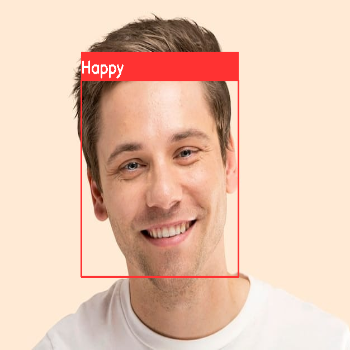

Converted /content/Happy_audio.mpeg to /content/Happy_audio.wav


In [47]:
from pydub import AudioSegment
import cv2
import numpy as np
import librosa
from IPython.display import Audio, display, HTML
from google.colab.patches import cv2_imshow
from keras.models import load_model

# Load the model and face detector
model = load_model('model_file.h5')
faceDetect = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

labels_dict = {0: 'Angry', 1: 'Disgust', 2: 'Fear', 3: 'Happy', 4: 'Neutral', 5: 'Sad', 6: 'Surprise'}

supportive_texts = {
    'Angry': 'Breathe in calmness, breathe out anger 😌',
    'Disgust': 'Let go of what bothers you, and make room for joy! 🌈',
    'Fear': 'Face your fears, and they will disappear 💪',
    'Happy': 'Smile, and the world smiles with you 😊',
    'Neutral': 'Life is a canvas, paint it with positivity 🎨',
    'Sad': 'Better days are ahead, and they start with a new sunrise ☀️',
    'Surprise': 'Life is full of surprises, embrace them with joy! 🎉'
}

# Set the image file path
image_path = "/content/happy3.jpeg"

def play_audio(audio_file):
    audio_data, sr = librosa.load(audio_file)
    audio_obj = Audio(audio_data, rate=sr)
    display(audio_obj)

def get_audio_file(emotion):
    audio_files = {
        'Angry': '/content/Anger_audio.mpeg',
        'Disgust': '/content/Disgust_audio.mpeg',
        'Fear': '/content/Fear_audio.mpeg',
        'Happy': '/content/Happy_audio.mpeg',
        'Neutral': '/content/Neutral_audio.mpeg',
        'Sad': '/content/Sad_audio.mpeg',
        'Surprise': '/content/Surprise_audio.mpeg'
    }
    return audio_files[emotion]

# Read the image
frame = cv2.imread(image_path)
gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
faces = faceDetect.detectMultiScale(gray, 1.3, 3)

if len(faces) > 0:
    for x, y, w, h in faces:
        sub_face_img = gray[y:y+h, x:x+w]
        resized = cv2.resize(sub_face_img, (48, 48))
        normalize = resized / 255.0
        reshaped = np.reshape(normalize, (1, 48, 48, 1))
        result = model.predict(reshaped)
        label = np.argmax(result, axis=1)[0]
        label_name = labels_dict[label]

        # Draw rectangles and text on the frame
        cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 0, 255), 1)
        cv2.rectangle(frame, (x, y), (x+w, y+h), (50, 50, 255), 2)
        cv2.rectangle(frame, (x, y-40), (x+w, y), (50, 50, 255), -1)
        cv2.putText(frame, labels_dict[label], (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

        # Display the predicted class label
        print(f"Predicted Emotion: {label_name} *{label}*")

        # Resize the output image for display
        output_width = 350  # Adjust width as needed
        output_height = 350  # Adjust height as needed
        resized_frame = cv2.resize(frame, (output_width, output_height))

        # Display the output image
        cv2_imshow(resized_frame)

        # Convert audio file from .mpeg to .wav
        audio_file_path = get_audio_file(label_name)
        output_audio_path = f'/content/{label_name}_audio.wav'
        audio = AudioSegment.from_file(audio_file_path)
        audio.export(output_audio_path, format='wav')
        print(f"Converted {audio_file_path} to {output_audio_path}")

        # Load and play the converted audio
        play_audio(output_audio_path)

        # Display supportive text
        display(HTML(f"<span style='font-family: Comic Sans MS; font-size: 24px; color: cyan'>{supportive_texts[label_name]}</span>"))
else:
    print("No faces detected.")

In [48]:
import cv2
import numpy as np
import librosa
from IPython.display import Audio, display, HTML
from google.colab.patches import cv2_imshow
from pydub import AudioSegment
from keras.models import load_model

# Load the model and face detector
model = load_model('model_file.h5')
faceDetect = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

labels_dict = {0: 'Angry', 1: 'Disgust', 2: 'Fear', 3: 'Happy', 4: 'Neutral', 5: 'Sad', 6: 'Surprise'}

supportive_texts = {
    'Angry': 'Breathe in calmness, breathe out anger 😌',
    'Disgust': 'Let go of what bothers you, and make room for joy! 🌈',
    'Fear': 'Face your fears, and they will disappear 💪',
    'Happy': 'Smile, and the world smiles with you 😊',
    'Neutral': 'Life is a canvas, paint it with positivity 🎨',
    'Sad': 'Better days are ahead, and they start with a new sunrise ☀️',
    'Surprise': 'Life is full of surprises, embrace them with joy! 🎉'
}

# Set the image file path
image_path = "/content/fear3.jpg"

def play_audio(audio_file):
    audio_data, sr = librosa.load(audio_file)
    audio_obj = Audio(audio_data, rate=sr)
    display(audio_obj)

def get_audio_file(emotion):
    audio_files = {
        'Angry': '/content/Anger_audio.mpeg',
        'Disgust': '/content/Disgust_audio.mpeg',
        'Fear': '/content/Fear_audio.mpeg',
        'Happy': '/content/Happy_audio.mpeg',
        'Neutral': '/content/Neutral_audio.mpeg',
        'Sad': '/content/Sad_audio.mpeg',
        'Surprise': '/content/Surprise_audio.mpeg'
    }
    return audio_files[emotion]

# Read the image
frame = cv2.imread(image_path)
gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
faces = faceDetect.detectMultiScale(gray, 1.3, 3)

if len(faces) > 0:
    for x, y, w, h in faces:
        sub_face_img = gray[y:y+h, x:x+w]
        resized = cv2.resize(sub_face_img, (48, 48))
        normalize = resized / 255.0
        reshaped = np.reshape(normalize, (1, 48, 48, 1))
        result = model.predict(reshaped)
        label = np.argmax(result, axis=1)[0]
        label_name = labels_dict[label]

        # Draw rectangles and text on the frame
        cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 0, 255), 1)
        cv2.rectangle(frame, (x, y), (x+w, y+h), (50, 50, 255), 2)
        cv2.rectangle(frame, (x, y-40), (x+w, y), (50, 50, 255), -1)
        cv2.putText(frame, labels_dict[label], (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

        # Display the predicted class label
        print(f"Predicted Emotion: {label_name} *{label}*")

        # Resize the output image for display
        output_width = 350  # Adjust width as needed
        output_height = 350  # Adjust height as needed
        resized_frame = cv2.resize(frame, (output_width, output_height))

        # Display the output image
        cv2_imshow(resized_frame)

        # Convert audio file from .mpeg to .wav
        audio_file_path = get_audio_file(label_name)
        output_audio_path = f'/content/{label_name}_audio.wav'
        audio = AudioSegment.from_file(audio_file_path)
        audio.export(output_audio_path, format='wav')
        print(f"Converted {audio_file_path} to {output_audio_path}")

        # Load and play the converted audio
        play_audio(output_audio_path)

        # Display supportive text
        display(HTML(f"<span style='font-family: Comic Sans MS; font-size: 24px; color: cyan'>{supportive_texts[label_name]}</span>"))
else:
    print("No faces detected.")

Output hidden; open in https://colab.research.google.com to view.

1/1 [==============================] - 0s 86ms/step
Predicted Emotion: Angry *0*


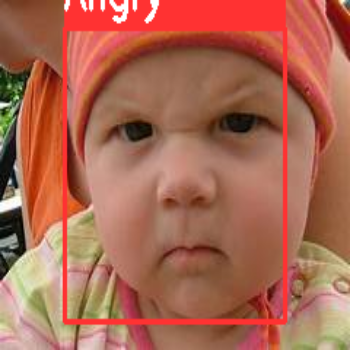

Converted /content/Anger_audio.mpeg to /content/Angry_audio.wav


In [49]:
import cv2
import numpy as np
import librosa
from IPython.display import Audio, display, HTML
from google.colab.patches import cv2_imshow
from pydub import AudioSegment
from keras.models import load_model

# Load the model and face detector
model = load_model('model_file.h5')
faceDetect = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

labels_dict = {0: 'Angry', 1: 'Disgust', 2: 'Fear', 3: 'Happy', 4: 'Neutral', 5: 'Sad', 6: 'Surprise'}

supportive_texts = {
    'Angry': 'Breathe in calmness, breathe out anger 😌',
    'Disgust': 'Let go of what bothers you, and make room for joy! 🌈',
    'Fear': 'Face your fears, and they will disappear 💪',
    'Happy': 'Smile, and the world smiles with you 😊',
    'Neutral': 'Life is a canvas, paint it with positivity 🎨',
    'Sad': 'Better days are ahead, and they start with a new sunrise ☀️',
    'Surprise': 'Life is full of surprises, embrace them with joy! 🎉'
}

# Set the image file path
image_path = "/content/angry1.jpg"

def play_audio(audio_file):
    audio_data, sr = librosa.load(audio_file)
    audio_obj = Audio(audio_data, rate=sr)
    display(audio_obj)

def get_audio_file(emotion):
    audio_files = {
        'Angry': '/content/Anger_audio.mpeg',
        'Disgust': '/content/Disgust_audio.mpeg',
        'Fear': '/content/Fear_audio.mpeg',
        'Happy': '/content/Happy_audio.mpeg',
        'Neutral': '/content/Neutral_audio.mpeg',
        'Sad': '/content/Sad_audio.mpeg',
        'Surprise': '/content/Surprise_audio.mpeg'
    }
    return audio_files[emotion]

# Read the image
frame = cv2.imread(image_path)
gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
faces = faceDetect.detectMultiScale(gray, 1.3, 3)

if len(faces) > 0:
    for x, y, w, h in faces:
        sub_face_img = gray[y:y+h, x:x+w]
        resized = cv2.resize(sub_face_img, (48, 48))
        normalize = resized / 255.0
        reshaped = np.reshape(normalize, (1, 48, 48, 1))
        result = model.predict(reshaped)
        label = np.argmax(result, axis=1)[0]
        label_name = labels_dict[label]

        # Draw rectangles and text on the frame
        cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 0, 255), 1)
        cv2.rectangle(frame, (x, y), (x+w, y+h), (50, 50, 255), 2)
        cv2.rectangle(frame, (x, y-40), (x+w, y), (50, 50, 255), -1)
        cv2.putText(frame, labels_dict[label], (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

        # Display the predicted class label
        print(f"Predicted Emotion: {label_name} *{label}*")

        # Resize the output image for display
        output_width = 350  # Adjust width as needed
        output_height = 350  # Adjust height as needed
        resized_frame = cv2.resize(frame, (output_width, output_height))

        # Display the output image
        cv2_imshow(resized_frame)

        # Convert audio file from .mpeg to .wav
        audio_file_path = get_audio_file(label_name)
        output_audio_path = f'/content/{label_name}_audio.wav'
        audio = AudioSegment.from_file(audio_file_path)
        audio.export(output_audio_path, format='wav')
        print(f"Converted {audio_file_path} to {output_audio_path}")

        # Load and play the converted audio
        play_audio(output_audio_path)

        # Display supportive text
        display(HTML(f"<span style='font-family: Comic Sans MS; font-size: 24px; color: cyan'>{supportive_texts[label_name]}</span>"))
else:
    print("No faces detected.")


In [50]:
import cv2
import numpy as np
import librosa
from IPython.display import Audio, display, HTML
from google.colab.patches import cv2_imshow
from pydub import AudioSegment
from keras.models import load_model

# Load the model and face detector
model = load_model('model_file.h5')
faceDetect = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

labels_dict = {0: 'Angry', 1: 'Disgust', 2: 'Fear', 3: 'Happy', 4: 'Neutral', 5: 'Sad', 6: 'Surprise'}

supportive_texts = {
    'Angry': 'Breathe in calmness, breathe out anger 😌',
    'Disgust': 'Let go of what bothers you, and make room for joy! 🌈',
    'Fear': 'Face your fears, and they will disappear 💪',
    'Happy': 'Smile, and the world smiles with you 😊',
    'Neutral': 'Life is a canvas, paint it with positivity 🎨',
    'Sad': 'Better days are ahead, and they start with a new sunrise ☀️',
    'Surprise': 'Life is full of surprises, embrace them with joy! 🎉'
}

# Set the image file path
image_path = "/content/angry.jpg"

def play_audio(audio_file):
    audio_data, sr = librosa.load(audio_file)
    audio_obj = Audio(audio_data, rate=sr)
    display(audio_obj)

def get_audio_file(emotion):
    audio_files = {
        'Angry': '/content/Anger_audio.mpeg',
        'Disgust': '/content/Disgust_audio.mpeg',
        'Fear': '/content/Fear_audio.mpeg',
        'Happy': '/content/Happy_audio.mpeg',
        'Neutral': '/content/Neutral_audio.mpeg',
        'Sad': '/content/Sad_audio.mpeg',
        'Surprise': '/content/Surprise_audio.mpeg'
    }
    return audio_files[emotion]

# Read the image
frame = cv2.imread(image_path)
gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
faces = faceDetect.detectMultiScale(gray, 1.3, 3)

if len(faces) > 0:
    for x, y, w, h in faces:
        sub_face_img = gray[y:y+h, x:x+w]
        resized = cv2.resize(sub_face_img, (48, 48))
        normalize = resized / 255.0
        reshaped = np.reshape(normalize, (1, 48, 48, 1))
        result = model.predict(reshaped)
        label = np.argmax(result, axis=1)[0]
        label_name = labels_dict[label]

        # Draw rectangles and text on the frame
        cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 0, 255), 1)
        cv2.rectangle(frame, (x, y), (x+w, y+h), (50, 50, 255), 2)
        cv2.rectangle(frame, (x, y-40), (x+w, y), (50, 50, 255), -1)
        cv2.putText(frame, labels_dict[label], (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

        # Display the predicted class label
        print(f"Predicted Emotion: {label_name} *{label}*")

        # Resize the output image for display
        output_width = 350  # Adjust width as needed
        output_height = 350  # Adjust height as needed
        resized_frame = cv2.resize(frame, (output_width, output_height))

        # Display the output image
        cv2_imshow(resized_frame)

        # Convert audio file from .mpeg to .wav
        audio_file_path = get_audio_file(label_name)
        output_audio_path = f'/content/{label_name}_audio.wav'
        audio = AudioSegment.from_file(audio_file_path)
        audio.export(output_audio_path, format='wav')
        print(f"Converted {audio_file_path} to {output_audio_path}")

        # Load and play the converted audio
        play_audio(output_audio_path)

        # Display supportive text
        display(HTML(f"<span style='font-family: Comic Sans MS; font-size: 24px; color: cyan'>{supportive_texts[label_name]}</span>"))
else:
    print("No faces detected.")

error: OpenCV(4.10.0) /io/opencv/modules/imgproc/src/color.cpp:196: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


1/1 [==============================] - 0s 86ms/step
Predicted Emotion: Happy *3*


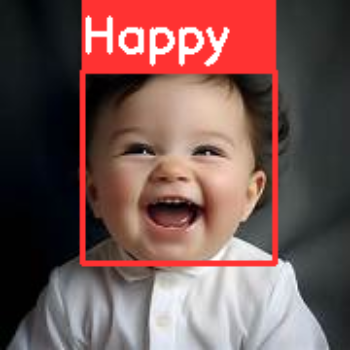

Converted /content/Happy_audio.mpeg to /content/Happy_audio.wav


In [51]:
import cv2
import numpy as np
import librosa
from IPython.display import Audio, display, HTML
from google.colab.patches import cv2_imshow
from pydub import AudioSegment
from keras.models import load_model

# Load the model and face detector
model = load_model('model_file.h5')
faceDetect = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

labels_dict = {0: 'Angry', 1: 'Disgust', 2: 'Fear', 3: 'Happy', 4: 'Neutral', 5: 'Sad', 6: 'Surprise'}

supportive_texts = {
    'Angry': 'Breathe in calmness, breathe out anger 😌',
    'Disgust': 'Let go of what bothers you, and make room for joy! 🌈',
    'Fear': 'Face your fears, and they will disappear 💪',
    'Happy': 'Smile, and the world smiles with you 😊',
    'Neutral': 'Life is a canvas, paint it with positivity 🎨',
    'Sad': 'Better days are ahead, and they start with a new sunrise ☀️',
    'Surprise': 'Life is full of surprises, embrace them with joy! 🎉'
}

# Set the image file path
image_path = "/content/happy1.jpg"

def play_audio(audio_file):
    audio_data, sr = librosa.load(audio_file)
    audio_obj = Audio(audio_data, rate=sr)
    display(audio_obj)

def get_audio_file(emotion):
    audio_files = {
        'Angry': '/content/Anger_audio.mpeg',
        'Disgust': '/content/Disgust_audio.mpeg',
        'Fear': '/content/Fear_audio.mpeg',
        'Happy': '/content/Happy_audio.mpeg',
        'Neutral': '/content/Neutral_audio.mpeg',
        'Sad': '/content/Sad_audio.mpeg',
        'Surprise': '/content/Surprise_audio.mpeg'
    }
    return audio_files[emotion]

# Read the image
frame = cv2.imread(image_path)
gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
faces = faceDetect.detectMultiScale(gray, 1.3, 3)

if len(faces) > 0:
    for x, y, w, h in faces:
        sub_face_img = gray[y:y+h, x:x+w]
        resized = cv2.resize(sub_face_img, (48, 48))
        normalize = resized / 255.0
        reshaped = np.reshape(normalize, (1, 48, 48, 1))
        result = model.predict(reshaped)
        label = np.argmax(result, axis=1)[0]
        label_name = labels_dict[label]

        # Draw rectangles and text on the frame
        cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 0, 255), 1)
        cv2.rectangle(frame, (x, y), (x+w, y+h), (50, 50, 255), 2)
        cv2.rectangle(frame, (x, y-40), (x+w, y), (50, 50, 255), -1)
        cv2.putText(frame, labels_dict[label], (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

        # Display the predicted class label
        print(f"Predicted Emotion: {label_name} *{label}*")

        # Resize the output image for display
        output_width = 350  # Adjust width as needed
        output_height = 350  # Adjust height as needed
        resized_frame = cv2.resize(frame, (output_width, output_height))

        # Display the output image
        cv2_imshow(resized_frame)

        # Convert audio file from .mpeg to .wav
        audio_file_path = get_audio_file(label_name)
        output_audio_path = f'/content/{label_name}_audio.wav'
        audio = AudioSegment.from_file(audio_file_path)
        audio.export(output_audio_path, format='wav')
        print(f"Converted {audio_file_path} to {output_audio_path}")

        # Load and play the converted audio
        play_audio(output_audio_path)

        # Display supportive text
        display(HTML(f"<span style='font-family: Comic Sans MS; font-size: 24px; color: cyan'>{supportive_texts[label_name]}</span>"))
else:
    print("No faces detected.")

In [54]:
import cv2
import numpy as np
import librosa
from IPython.display import Audio, display, HTML
from google.colab.patches import cv2_imshow
from pydub import AudioSegment
from keras.models import load_model

# Load the model and face detector
model = load_model('model_file.h5')
faceDetect = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

labels_dict = {0: 'Angry', 1: 'Disgust', 2: 'Fear', 3: 'Happy', 4: 'Neutral', 5: 'Sad', 6: 'Surprise'}

supportive_texts = {
    'Angry': 'Breathe in calmness, breathe out anger 😌',
    'Disgust': 'Let go of what bothers you, and make room for joy! 🌈',
    'Fear': 'Face your fears, and they will disappear 💪',
    'Happy': 'Smile, and the world smiles with you 😊',
    'Neutral': 'Life is a canvas, paint it with positivity 🎨',
    'Sad': 'Better days are ahead, and they start with a new sunrise ☀️',
    'Surprise': 'Life is full of surprises, embrace them with joy! 🎉'
}

# Set the image file path
image_path = "/content/neutral13.jpg"

def play_audio(audio_file):
    audio_data, sr = librosa.load(audio_file)
    audio_obj = Audio(audio_data, rate=sr)
    display(audio_obj)

def get_audio_file(emotion):
    audio_files = {
        'Angry': '/content/Anger_audio.mpeg',
        'Disgust': '/content/Disgust_audio.mpeg',
        'Fear': '/content/Fear_audio.mpeg',
        'Happy': '/content/Happy_audio.mpeg',
        'Neutral': '/content/Neutral_audio.mpeg',
        'Sad': '/content/Sad_audio.mpeg',
        'Surprise': '/content/Surprise_audio.mpeg'
    }
    return audio_files[emotion]

# Read the image
frame = cv2.imread(image_path)
gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
faces = faceDetect.detectMultiScale(gray, 1.3, 3)

if len(faces) > 0:
    for x, y, w, h in faces:
        sub_face_img = gray[y:y+h, x:x+w]
        resized = cv2.resize(sub_face_img, (48, 48))
        normalize = resized / 255.0
        reshaped = np.reshape(normalize, (1, 48, 48, 1))
        result = model.predict(reshaped)
        label = np.argmax(result, axis=1)[0]
        label_name = labels_dict[label]

        # Draw rectangles and text on the frame
        cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 0, 255), 1)
        cv2.rectangle(frame, (x, y), (x+w, y+h), (50, 50, 255), 2)
        cv2.rectangle(frame, (x, y-40), (x+w, y), (50, 50, 255), -1)
        cv2.putText(frame, labels_dict[label], (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

        # Display the predicted class label
        print(f"Predicted Emotion: {label_name} *{label}*")

        # Resize the output image for display
        output_width = 350  # Adjust width as needed
        output_height = 350  # Adjust height as needed
        resized_frame = cv2.resize(frame, (output_width, output_height))

        # Display the output image
        cv2_imshow(resized_frame)

        # Convert audio file from .mpeg to .wav
        audio_file_path = get_audio_file(label_name)
        output_audio_path = f'/content/{label_name}_audio.wav'
        audio = AudioSegment.from_file(audio_file_path)
        audio.export(output_audio_path, format='wav')
        print(f"Converted {audio_file_path} to {output_audio_path}")

        # Load and play the converted audio
        play_audio(output_audio_path)

        # Display supportive text
        display(HTML(f"<span style='font-family: Comic Sans MS; font-size: 24px; color: cyan'>{supportive_texts[label_name]}</span>"))
else:
    print("No faces detected.")

Output hidden; open in https://colab.research.google.com to view.

In [55]:
import cv2
import numpy as np
import librosa
from IPython.display import Audio, display, HTML
from google.colab.patches import cv2_imshow
from pydub import AudioSegment
from keras.models import load_model

# Load the model and face detector
model = load_model('model_file.h5')
faceDetect = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

labels_dict = {0: 'Angry', 1: 'Disgust', 2: 'Fear', 3: 'Happy', 4: 'Neutral', 5: 'Sad', 6: 'Surprise'}

supportive_texts = {
    'Angry': 'Breathe in calmness, breathe out anger 😌',
    'Disgust': 'Let go of what bothers you, and make room for joy! 🌈',
    'Fear': 'Face your fears, and they will disappear 💪',
    'Happy': 'Smile, and the world smiles with you 😊',
    'Neutral': 'Life is a canvas, paint it with positivity 🎨',
    'Sad': 'Better days are ahead, and they start with a new sunrise ☀️',
    'Surprise': 'Life is full of surprises, embrace them with joy! 🎉'
}

# Set the image file path
image_path = "/content/fear.jpg"

def play_audio(audio_file):
    audio_data, sr = librosa.load(audio_file)
    audio_obj = Audio(audio_data, rate=sr)
    display(audio_obj)

def get_audio_file(emotion):
    audio_files = {
        'Angry': '/content/Anger_audio.mpeg',
        'Disgust': '/content/Disgust_audio.mpeg',
        'Fear': '/content/Fear_audio.mpeg',
        'Happy': '/content/Happy_audio.mpeg',
        'Neutral': '/content/Neutral_audio.mpeg',
        'Sad': '/content/Sad_audio.mpeg',
        'Surprise': '/content/Surprise_audio.mpeg'
    }
    return audio_files[emotion]

# Read the image
frame = cv2.imread(image_path)
gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
faces = faceDetect.detectMultiScale(gray, 1.3, 3)

if len(faces) > 0:
    for x, y, w, h in faces:
        sub_face_img = gray[y:y+h, x:x+w]
        resized = cv2.resize(sub_face_img, (48, 48))
        normalize = resized / 255.0
        reshaped = np.reshape(normalize, (1, 48, 48, 1))
        result = model.predict(reshaped)
        label = np.argmax(result, axis=1)[0]
        label_name = labels_dict[label]

        # Draw rectangles and text on the frame
        cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 0, 255), 1)
        cv2.rectangle(frame, (x, y), (x+w, y+h), (50, 50, 255), 2)
        cv2.rectangle(frame, (x, y-40), (x+w, y), (50, 50, 255), -1)
        cv2.putText(frame, labels_dict[label], (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

        # Display the predicted class label
        print(f"Predicted Emotion: {label_name} *{label}*")

        # Resize the output image for display
        output_width = 350  # Adjust width as needed
        output_height = 350  # Adjust height as needed
        resized_frame = cv2.resize(frame, (output_width, output_height))

        # Display the output image
        cv2_imshow(resized_frame)

        # Convert audio file from .mpeg to .wav
        audio_file_path = get_audio_file(label_name)
        output_audio_path = f'/content/{label_name}_audio.wav'
        audio = AudioSegment.from_file(audio_file_path)
        audio.export(output_audio_path, format='wav')
        print(f"Converted {audio_file_path} to {output_audio_path}")

        # Load and play the converted audio
        play_audio(output_audio_path)

        # Display supportive text
        display(HTML(f"<span style='font-family: Comic Sans MS; font-size: 24px; color: cyan'>{supportive_texts[label_name]}</span>"))
else:
    print("No faces detected.")

Output hidden; open in https://colab.research.google.com to view.

1/1 [==============================] - 0s 88ms/step
Predicted Emotion: Surprise *6*


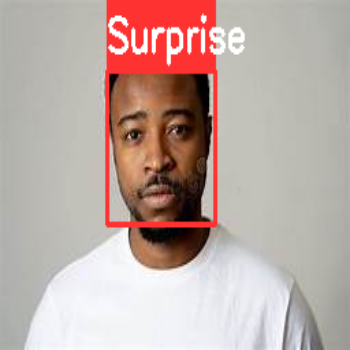

Converted /content/Surprise_audio.mpeg to /content/Surprise_audio.wav


In [57]:
import cv2
import numpy as np
import librosa
from IPython.display import Audio, display, HTML
from google.colab.patches import cv2_imshow
from pydub import AudioSegment
from keras.models import load_model

# Load the model and face detector
model = load_model('model_file.h5')
faceDetect = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

labels_dict = {0: 'Angry', 1: 'Disgust', 2: 'Fear', 3: 'Happy', 4: 'Neutral', 5: 'Sad', 6: 'Surprise'}

supportive_texts = {
    'Angry': 'Breathe in calmness, breathe out anger 😌',
    'Disgust': 'Let go of what bothers you, and make room for joy! 🌈',
    'Fear': 'Face your fears, and they will disappear 💪',
    'Happy': 'Smile, and the world smiles with you 😊',
    'Neutral': 'Life is a canvas, paint it with positivity 🎨',
    'Sad': 'Better days are ahead, and they start with a new sunrise ☀️',
    'Surprise': 'Life is full of surprises, embrace them with joy! 🎉'
}

# Set the image file path
image_path = "/content/neutral2.jpg"

def play_audio(audio_file):
    audio_data, sr = librosa.load(audio_file)
    audio_obj = Audio(audio_data, rate=sr)
    display(audio_obj)

def get_audio_file(emotion):
    audio_files = {
        'Angry': '/content/Anger_audio.mpeg',
        'Disgust': '/content/Disgust_audio.mpeg',
        'Fear': '/content/Fear_audio.mpeg',
        'Happy': '/content/Happy_audio.mpeg',
        'Neutral': '/content/Neutral_audio.mpeg',
        'Sad': '/content/Sad_audio.mpeg',
        'Surprise': '/content/Surprise_audio.mpeg'
    }
    return audio_files[emotion]

# Read the image
frame = cv2.imread(image_path)
gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
faces = faceDetect.detectMultiScale(gray, 1.3, 3)

if len(faces) > 0:
    for x, y, w, h in faces:
        sub_face_img = gray[y:y+h, x:x+w]
        resized = cv2.resize(sub_face_img, (48, 48))
        normalize = resized / 255.0
        reshaped = np.reshape(normalize, (1, 48, 48, 1))
        result = model.predict(reshaped)
        label = np.argmax(result, axis=1)[0]
        label_name = labels_dict[label]

        # Draw rectangles and text on the frame
        cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 0, 255), 1)
        cv2.rectangle(frame, (x, y), (x+w, y+h), (50, 50, 255), 2)
        cv2.rectangle(frame, (x, y-40), (x+w, y), (50, 50, 255), -1)
        cv2.putText(frame, labels_dict[label], (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

        # Display the predicted class label
        print(f"Predicted Emotion: {label_name} *{label}*")

        # Resize the output image for display
        output_width = 350  # Adjust width as needed
        output_height = 350  # Adjust height as needed
        resized_frame = cv2.resize(frame, (output_width, output_height))

        # Display the output image
        cv2_imshow(resized_frame)

        # Convert audio file from .mpeg to .wav
        audio_file_path = get_audio_file(label_name)
        output_audio_path = f'/content/{label_name}_audio.wav'
        audio = AudioSegment.from_file(audio_file_path)
        audio.export(output_audio_path, format='wav')
        print(f"Converted {audio_file_path} to {output_audio_path}")

        # Load and play the converted audio
        play_audio(output_audio_path)

        # Display supportive text
        display(HTML(f"<span style='font-family: Comic Sans MS; font-size: 24px; color: cyan'>{supportive_texts[label_name]}</span>"))
else:
    print("No faces detected.")

In [ ]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f:
    f.write(binary)
  return filename

<IPython.core.display.Javascript object>

Saved to photo.jpg


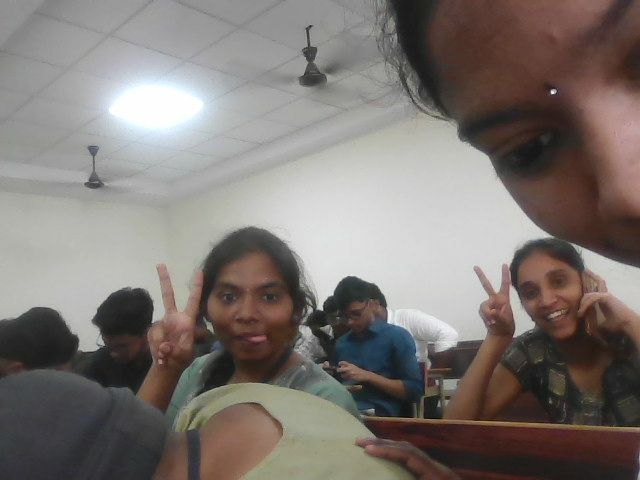

In [59]:
from IPython.display import Image
try:
  filename = take_photo()
  print('Saved to {}'.format(filename))

  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

In [58]:
import cv2
import numpy as np
import librosa
from IPython.display import Audio, display, HTML
from google.colab.patches import cv2_imshow
from pydub import AudioSegment
from keras.models import load_model
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

# Load the model and face detector
model = load_model('model_file.h5')
faceDetect = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

labels_dict = {0: 'Angry', 1: 'Disgust', 2: 'Fear', 3: 'Happy', 4: 'Neutral', 5: 'Sad', 6: 'Surprise'}

supportive_texts = {
    'Angry': 'Breathe in calmness, breathe out anger 😌',
    'Disgust': 'Let go of what bothers you, and make room for joy! 🌈',
    'Fear': 'Face your fears, and they will disappear 💪',
    'Happy': 'Smile, and the world smiles with you 😊',
    'Neutral': 'Life is a canvas, paint it with positivity 🎨',
    'Sad': 'Better days are ahead, and they start with a new sunrise ☀️',
    'Surprise': 'Life is full of surprises, embrace them with joy! 🎉'
}

def play_audio(audio_file):
    audio_data, sr = librosa.load(audio_file)
    audio_obj = Audio(audio_data, rate=sr)
    display(audio_obj)

def get_audio_file(emotion):
    audio_files = {
        'Angry': '/content/Anger_audio.mpeg',
        'Disgust': '/content/Disgust_audio.mpeg',
        'Fear': '/content/Fear_audio.mpeg',
        'Happy': '/content/Happy_audio.mpeg',
        'Neutral': '/content/Neutral_audio.mpeg',
        'Sad': '/content/Sad_audio.mpeg',
        'Surprise': '/content/Surprise_audio.mpeg'
    }
    return audio_files[emotion]

def take_photo(filename='photo.jpg', quality=0.8):
    js = Javascript('''
      async function takePhoto(quality) {
        const div = document.createElement('div');
        const capture = document.createElement('button');
        capture.textContent = 'Capture';
        div.appendChild(capture);

        const video = document.createElement('video');
        video.style.display = 'block';
        const stream = await navigator.mediaDevices.getUserMedia({video: true});

        document.body.appendChild(div);
        div.appendChild(video);
        video.srcObject = stream;
        await video.play();

        google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

        await new Promise((resolve) => capture.onclick = resolve);

        const canvas = document.createElement('canvas');
        canvas.width = video.videoWidth;
        canvas.height = video.videoHeight;
        canvas.getContext('2d').drawImage(video, 0, 0);
        stream.getVideoTracks()[0].stop();
        div.remove();
        return canvas.toDataURL('image/jpeg', quality);
      }
    ''')
    display(js)
    data = eval_js('takePhoto({})'.format(quality))
    binary = b64decode(data.split(',')[1])
    with open(filename, 'wb') as f:
        f.write(binary)
    return filename

# Capture photo from webcam
try:
    filename = take_photo()
    print('Saved to {}'.format(filename))

    # Show the image which was just taken.
    img = cv2.imread(filename)
    print("Loaded Image:")
    cv2_imshow(img)

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    print("Grayscale Image:")
    cv2_imshow(gray)

    # Detect faces
    faces = faceDetect.detectMultiScale(gray, 1.3, 3)

    if len(faces) > 0:
        print(f"Detected faces: {faces}")
        for (x, y, w, h) in faces:
            sub_face_img = gray[y:y+h, x:x+w]
            resized = cv2.resize(sub_face_img, (48, 48))
            print("Resized Face Image:")
            cv2_imshow(resized)

            normalize = resized / 255.0
            reshaped = np.reshape(normalize, (1, 48, 48, 1))
            result = model.predict(reshaped)
            label = np.argmax(result, axis=1)[0]
            label_name = labels_dict[label]

            # Draw rectangles and text on the frame
            cv2.rectangle(img, (x, y), (x+w, y+h), (0, 0, 255), 3)  # Outer rectangle
            cv2.rectangle(img, (x, y), (x+w, y+h), (50, 50, 255), 2)  # Inner rectangle
            cv2.rectangle(img, (x, y-40), (x+w, y), (50, 50, 255), -1)  # Background for label
            cv2.putText(img, label_name, (x + 5, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

            # Display the predicted class label
            print(f"Predicted Emotion: {label_name} ({label})")

            # Display the output image
            cv2_imshow(img)

            # Convert audio file from .mpeg to .wav
            audio_file_path = get_audio_file(label_name)
            output_audio_path = f'/content/{label_name}_audio.wav'
            audio = AudioSegment.from_file(audio_file_path)
            audio.export(output_audio_path, format='wav')
            print(f"Converted {audio_file_path} to {output_audio_path}")

            # Load and play the converted audio
            play_audio(output_audio_path)

            # Display supportive text
            display(HTML(f"<span style='font-family: Comic Sans MS; font-size: 24px; color: cyan'>{supportive_texts[label_name]}</span>"))
    else:
        print("No faces detected.")
except Exception as err:
    print(str(err))


Output hidden; open in https://colab.research.google.com to view.

In [62]:
import cv2
import numpy as np
import librosa
from IPython.display import Audio, display, HTML
from google.colab.patches import cv2_imshow
from pydub import AudioSegment
from keras.models import load_model
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

# Load the model and face detector
model = load_model('model_file.h5')
faceDetect = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

labels_dict = {0: 'Angry', 1: 'Disgust', 2: 'Fear', 3: 'Happy', 4: 'Neutral', 5: 'Sad', 6: 'Surprise'}

supportive_texts = {
    'Angry': 'Breathe in calmness, breathe out anger 😌',
    'Disgust': 'Let go of what bothers you, and make room for joy! 🌈',
    'Fear': 'Face your fears, and they will disappear 💪',
    'Happy': 'Smile, and the world smiles with you 😊',
    'Neutral': 'Life is a canvas, paint it with positivity 🎨',
    'Sad': 'Better days are ahead, and they start with a new sunrise ☀️',
    'Surprise': 'Life is full of surprises, embrace them with joy! 🎉'
}

def play_audio(audio_file):
    audio_data, sr = librosa.load(audio_file)
    audio_obj = Audio(audio_data, rate=sr)
    display(audio_obj)

def get_audio_file(emotion):
    audio_files = {
        'Angry': '/content/Anger_audio.mpeg',
        'Disgust': '/content/Disgust_audio.mpeg',
        'Fear': '/content/Fear_audio.mpeg',
        'Happy': '/content/Happy_audio.mpeg',
        'Neutral': '/content/Neutral_audio.mpeg',
        'Sad': '/content/Sad_audio.mpeg',
        'Surprise': '/content/Surprise_audio.mpeg'
    }
    return audio_files[emotion]

def take_photo(filename='photo.jpg', quality=0.8):
    js = Javascript('''
      async function takePhoto(quality) {
        const div = document.createElement('div');
        const capture = document.createElement('button');
        capture.textContent = 'Capture';
        div.appendChild(capture);

        const video = document.createElement('video');
        video.style.display = 'block';
        const stream = await navigator.mediaDevices.getUserMedia({video: true});

        document.body.appendChild(div);
        div.appendChild(video);
        video.srcObject = stream;
        await video.play();

        google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

        await new Promise((resolve) => capture.onclick = resolve);

        const canvas = document.createElement('canvas');
        canvas.width = video.videoWidth;
        canvas.height = video.videoHeight;
        canvas.getContext('2d').drawImage(video, 0, 0);
        stream.getVideoTracks()[0].stop();
        div.remove();
        return canvas.toDataURL('image/jpeg', quality);
      }
    ''')
    display(js)
    data = eval_js('takePhoto({})'.format(quality))
    binary = b64decode(data.split(',')[1])
    with open(filename, 'wb') as f:
        f.write(binary)
    return filename

# Capture photo from webcam
try:
    filename = take_photo()
    print('Saved to {}'.format(filename))

    # Show the image which was just taken.
    img = cv2.imread(filename)
    print("Loaded Image:")
    cv2_imshow(img)

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    print("Grayscale Image:")
    cv2_imshow(gray)

    # Detect faces
    faces = faceDetect.detectMultiScale(gray, 1.3, 3)

    if len(faces) > 0:
        print(f"Detected faces: {faces}")
        for (x, y, w, h) in faces:
            sub_face_img = gray[y:y+h, x:x+w]
            resized = cv2.resize(sub_face_img, (48, 48))
            print("Resized Face Image:")
            cv2_imshow(resized)

            normalize = resized / 255.0
            reshaped = np.reshape(normalize, (1, 48, 48, 1))
            result = model.predict(reshaped)
            label = np.argmax(result, axis=1)[0]
            label_name = labels_dict[label]

            # Draw rectangles and text on the frame
            cv2.rectangle(img, (x, y), (x+w, y+h), (0, 0, 255), 3)  # Outer rectangle
            cv2.rectangle(img, (x, y), (x+w, y+h), (50, 50, 255), 2)  # Inner rectangle
            cv2.rectangle(img, (x, y-40), (x+w, y), (50, 50, 255), -1)  # Background for label
            cv2.putText(img, label_name, (x + 5, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

            # Display the predicted class label
            print(f"Predicted Emotion: {label_name} ({label})")

            # Display the output image
            cv2_imshow(img)

            # Convert audio file from .mpeg to .wav
            audio_file_path = get_audio_file(label_name)
            output_audio_path = f'/content/{label_name}_audio.wav'
            audio = AudioSegment.from_file(audio_file_path)
            audio.export(output_audio_path, format='wav')
            print(f"Converted {audio_file_path} to {output_audio_path}")

            # Load and play the converted audio
            play_audio(output_audio_path)

            # Display supportive text
            display(HTML(f"<span style='font-family: Comic Sans MS; font-size: 24px; color: cyan'>{supportive_texts[label_name]}</span>"))
    else:
        print("No faces detected.")
except Exception as err:
    print(str(err))

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
import cv2
import numpy as np
import librosa
from IPython.display import Audio, display, HTML
from google.colab.patches import cv2_imshow
from pydub import AudioSegment
from keras.models import load_model
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

# Load the model and face detector
model = load_model('model_file.h5')
faceDetect = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

labels_dict = {0: 'Angry', 1: 'Disgust', 2: 'Fear', 3: 'Happy', 4: 'Neutral', 5: 'Sad', 6: 'Surprise'}

supportive_texts = {
    'Angry': 'Breathe in calmness, breathe out anger 😌',
    'Disgust': 'Let go of what bothers you, and make room for joy! 🌈',
    'Fear': 'Face your fears, and they will disappear 💪',
    'Happy': 'Smile, and the world smiles with you 😊',
    'Neutral': 'Life is a canvas, paint it with positivity 🎨',
    'Sad': 'Better days are ahead, and they start with a new sunrise ☀️',
    'Surprise': 'Life is full of surprises, embrace them with joy! 🎉'
}

def play_audio(audio_file):
    audio_data, sr = librosa.load(audio_file)
    audio_obj = Audio(audio_data, rate=sr)
    display(audio_obj)

def get_audio_file(emotion):
    audio_files = {
        'Angry': '/content/Anger_audio.mpeg',
        'Disgust': '/content/Disgust_audio.mpeg',
        'Fear': '/content/Fear_audio.mpeg',
        'Happy': '/content/Happy_audio.mpeg',
        'Neutral': '/content/Neutral_audio.mpeg',
        'Sad': '/content/Sad_audio.mpeg',
        'Surprise': '/content/Surprise_audio.mpeg'
    }
    return audio_files[emotion]

def take_photo(filename='photo.jpg', quality=0.8):
    js = Javascript('''
      async function takePhoto(quality) {
        const div = document.createElement('div');
        const capture = document.createElement('button');
        capture.textContent = 'Capture';
        div.appendChild(capture);

        const video = document.createElement('video');
        video.style.display = 'block';
        const stream = await navigator.mediaDevices.getUserMedia({video: true});

        document.body.appendChild(div);
        div.appendChild(video);
        video.srcObject = stream;
        await video.play();

        google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

        await new Promise((resolve) => capture.onclick = resolve);

        const canvas = document.createElement('canvas');
        canvas.width = video.videoWidth;
        canvas.height = video.videoHeight;
        canvas.getContext('2d').drawImage(video, 0, 0);
        stream.getVideoTracks()[0].stop();
        div.remove();
        return canvas.toDataURL('image/jpeg', quality);
      }
    ''')
    display(js)
    data = eval_js('takePhoto({})'.format(quality))
    binary = b64decode(data.split(',')[1])
    with open(filename, 'wb') as f:
        f.write(binary)
    return filename

# Capture photo from webcam
try:
    filename = take_photo()
    print('Saved to {}'.format(filename))

    # Show the image which was just taken.
    img = cv2.imread(filename)
    print("Loaded Image:")
    cv2_imshow(img)

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    print("Grayscale Image:")
    cv2_imshow(gray)

    # Detect faces
    faces = faceDetect.detectMultiScale(gray, 1.3, 3)

    if len(faces) > 0:
        print(f"Detected faces: {faces}")
        for (x, y, w, h) in faces:
            sub_face_img = gray[y:y+h, x:x+w]
            resized = cv2.resize(sub_face_img, (48, 48))
            print("Resized Face Image:")
            cv2_imshow(resized)

            normalize = resized / 255.0
            reshaped = np.reshape(normalize, (1, 48, 48, 1))
            result = model.predict(reshaped)
            label = np.argmax(result, axis=1)[0]
            label_name = labels_dict[label]

            # Draw rectangles and text on the frame
            cv2.rectangle(img, (x, y), (x+w, y+h), (0, 0, 255), 3)  # Outer rectangle
            cv2.rectangle(img, (x, y), (x+w, y+h), (50, 50, 255), 2)  # Inner rectangle
            cv2.rectangle(img, (x, y-40), (x+w, y), (50, 50, 255), -1)  # Background for label
            cv2.putText(img, label_name, (x + 5, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

            # Display the predicted class label
            print(f"Predicted Emotion: {label_name} ({label})")

            # Display the output image
            cv2_imshow(img)

            # Convert audio file from .mpeg to .wav
            audio_file_path = get_audio_file(label_name)
            output_audio_path = f'/content/{label_name}_audio.wav'
            audio = AudioSegment.from_file(audio_file_path)
            audio.export(output_audio_path, format='wav')
            print(f"Converted {audio_file_path} to {output_audio_path}")

            # Load and play the converted audio
            play_audio(output_audio_path)

            # Display supportive text
            display(HTML(f"<span style='font-family: Comic Sans MS; font-size: 24px; color: cyan'>{supportive_texts[label_name]}</span>"))
    else:
        print("No faces detected.")
except Exception as err:
    print(str(err))

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
import cv2
import numpy as np
import librosa
from IPython.display import Audio, display, HTML
from google.colab.patches import cv2_imshow
from pydub import AudioSegment
from keras.models import load_model
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

# Load the model and face detector
model = load_model('model_file.h5')
faceDetect = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

labels_dict = {0: 'Angry', 1: 'Disgust', 2: 'Fear', 3: 'Happy', 4: 'Neutral', 5: 'Sad', 6: 'Surprise'}

supportive_texts = {
    'Angry': 'Breathe in calmness, breathe out anger 😌',
    'Disgust': 'Let go of what bothers you, and make room for joy! 🌈',
    'Fear': 'Face your fears, and they will disappear 💪',
    'Happy': 'Smile, and the world smiles with you 😊',
    'Neutral': 'Life is a canvas, paint it with positivity 🎨',
    'Sad': 'Better days are ahead, and they start with a new sunrise ☀️',
    'Surprise': 'Life is full of surprises, embrace them with joy! 🎉'
}

def play_audio(audio_file):
    audio_data, sr = librosa.load(audio_file)
    audio_obj = Audio(audio_data, rate=sr)
    display(audio_obj)

def get_audio_file(emotion):
    audio_files = {
        'Angry': '/content/Anger_audio.mpeg',
        'Disgust': '/content/Disgust_audio.mpeg',
        'Fear': '/content/Fear_audio.mpeg',
        'Happy': '/content/Happy_audio.mpeg',
        'Neutral': '/content/Neutral_audio.mpeg',
        'Sad': '/content/Sad_audio.mpeg',
        'Surprise': '/content/Surprise_audio.mpeg'
    }
    return audio_files[emotion]

def take_photo(filename='photo.jpg', quality=0.8):
    js = Javascript('''
      async function takePhoto(quality) {
        const div = document.createElement('div');
        const capture = document.createElement('button');
        capture.textContent = 'Capture';
        div.appendChild(capture);

        const video = document.createElement('video');
        video.style.display = 'block';
        const stream = await navigator.mediaDevices.getUserMedia({video: true});

        document.body.appendChild(div);
        div.appendChild(video);
        video.srcObject = stream;
        await video.play();

        google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

        await new Promise((resolve) => capture.onclick = resolve);

        const canvas = document.createElement('canvas');
        canvas.width = video.videoWidth;
        canvas.height = video.videoHeight;
        canvas.getContext('2d').drawImage(video, 0, 0);
        stream.getVideoTracks()[0].stop();
        div.remove();
        return canvas.toDataURL('image/jpeg', quality);
      }
    ''')
    display(js)
    data = eval_js('takePhoto({})'.format(quality))
    binary = b64decode(data.split(',')[1])
    with open(filename, 'wb') as f:
        f.write(binary)
    return filename

# Capture photo from webcam
try:
    filename = take_photo()
    print('Saved to {}'.format(filename))

    # Show the image which was just taken.
    img = cv2.imread(filename)
    print("Loaded Image:")
    cv2_imshow(img)

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    print("Grayscale Image:")
    cv2_imshow(gray)

    # Detect faces
    faces = faceDetect.detectMultiScale(gray, 1.3, 3)

    if len(faces) > 0:
        print(f"Detected faces: {faces}")
        for (x, y, w, h) in faces:
            sub_face_img = gray[y:y+h, x:x+w]
            resized = cv2.resize(sub_face_img, (48, 48))
            print("Resized Face Image:")
            cv2_imshow(resized)

            normalize = resized / 255.0
            reshaped = np.reshape(normalize, (1, 48, 48, 1))
            result = model.predict(reshaped)
            label = np.argmax(result, axis=1)[0]
            label_name = labels_dict[label]

            # Draw rectangles and text on the frame
            cv2.rectangle(img, (x, y), (x+w, y+h), (0, 0, 255), 3)  # Outer rectangle
            cv2.rectangle(img, (x, y), (x+w, y+h), (50, 50, 255), 2)  # Inner rectangle
            cv2.rectangle(img, (x, y-40), (x+w, y), (50, 50, 255), -1)  # Background for label
            cv2.putText(img, label_name, (x + 5, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

            # Display the predicted class label
            print(f"Predicted Emotion: {label_name} ({label})")

            # Display the output image
            cv2_imshow(img)

            # Convert audio file from .mpeg to .wav
            audio_file_path = get_audio_file(label_name)
            output_audio_path = f'/content/{label_name}_audio.wav'
            audio = AudioSegment.from_file(audio_file_path)
            audio.export(output_audio_path, format='wav')
            print(f"Converted {audio_file_path} to {output_audio_path}")

            # Load and play the converted audio
            play_audio(output_audio_path)

            # Display supportive text
            display(HTML(f"<span style='font-family: Comic Sans MS; font-size: 24px; color: cyan'>{supportive_texts[label_name]}</span>"))
    else:
        print("No faces detected.")
except Exception as err:
    print(str(err))

Output hidden; open in https://colab.research.google.com to view.

<IPython.core.display.Javascript object>

Saved to photo.jpg
1/1 [==============================] - 0s 139ms/step
Predicted Emotion: Happy (3)


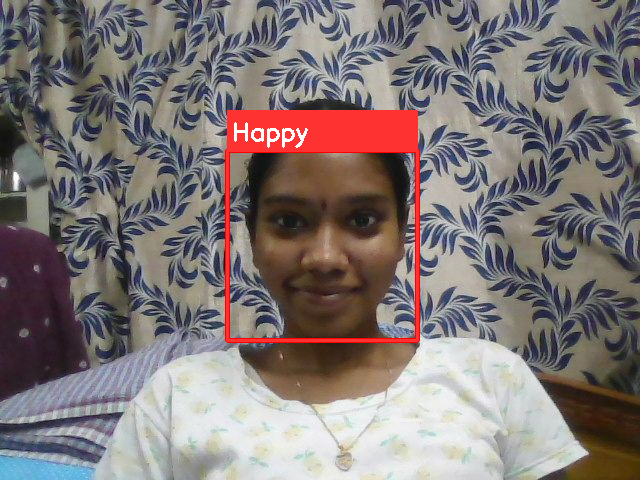

Converted /content/Happy_audio.mpeg to /content/Happy_audio.wav


In [ ]:
import cv2
import numpy as np
import librosa
from IPython.display import Audio, display, HTML
from google.colab.patches import cv2_imshow
from pydub import AudioSegment
from keras.models import load_model
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

# Load the model and face detector
model = load_model('model_file.h5')
faceDetect = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

labels_dict = {0: 'Angry', 1: 'Disgust', 2: 'Fear', 3: 'Happy', 4: 'Neutral', 5: 'Sad', 6: 'Surprise'}

supportive_texts = {
    'Angry': 'Breathe in calmness, breathe out anger 😌',
    'Disgust': 'Let go of what bothers you, and make room for joy! 🌈',
    'Fear': 'Face your fears, and they will disappear 💪',
    'Happy': 'Smile, and the world smiles with you 😊',
    'Neutral': 'Life is a canvas, paint it with positivity 🎨',
    'Sad': 'Better days are ahead, and they start with a new sunrise ☀️',
    'Surprise': 'Life is full of surprises, embrace them with joy! 🎉'
}

def play_audio(audio_file):
    audio_data, sr = librosa.load(audio_file)
    audio_obj = Audio(audio_data, rate=sr)
    display(audio_obj)

def get_audio_file(emotion):
    audio_files = {
        'Angry': '/content/Anger_audio.mpeg',
        'Disgust': '/content/Disgust_audio.mpeg',
        'Fear': '/content/Fear_audio.mpeg',
        'Happy': '/content/Happy_audio.mpeg',
        'Neutral': '/content/Neutral_audio.mpeg',
        'Sad': '/content/Sad_audio.mpeg',
        'Surprise': '/content/Surprise_audio.mpeg'
    }
    return audio_files[emotion]

def take_photo(filename='photo.jpg', quality=0.8):
    js = Javascript('''
      async function takePhoto(quality) {
        const div = document.createElement('div');
        const capture = document.createElement('button');
        capture.textContent = 'Capture';
        div.appendChild(capture);

        const video = document.createElement('video');
        video.style.display = 'block';
        const stream = await navigator.mediaDevices.getUserMedia({video: true});

        document.body.appendChild(div);
        div.appendChild(video);
        video.srcObject = stream;
        await video.play();

        google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

        await new Promise((resolve) => capture.onclick = resolve);

        const canvas = document.createElement('canvas');
        canvas.width = video.videoWidth;
        canvas.height = video.videoHeight;
        canvas.getContext('2d').drawImage(video, 0, 0);
        stream.getVideoTracks()[0].stop();
        div.remove();
        return canvas.toDataURL('image/jpeg', quality);
      }
    ''')
    display(js)
    data = eval_js('takePhoto({})'.format(quality))
    binary = b64decode(data.split(',')[1])
    with open(filename, 'wb') as f:
        f.write(binary)
    return filename

# Capture photo from webcam
try:
    filename = take_photo()
    print('Saved to {}'.format(filename))

    # Show the image which was just taken.
    img = cv2.imread(filename)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = faceDetect.detectMultiScale(gray, 1.3, 3)

    if len(faces) > 0:
        for x, y, w, h in faces:
            sub_face_img = gray[y:y+h, x:x+w]
            resized = cv2.resize(sub_face_img, (48, 48))
            normalize = resized / 255.0
            reshaped = np.reshape(normalize, (1, 48, 48, 1))
            result = model.predict(reshaped)
            label = np.argmax(result, axis=1)[0]
            label_name = labels_dict[label]

            # Draw rectangles and text on the frame
            cv2.rectangle(img, (x, y), (x+w, y+h), (0, 0, 255), 3)  # Outer rectangle
            cv2.rectangle(img, (x, y), (x+w, y+h), (50, 50, 255), 2)  # Inner rectangle
            cv2.rectangle(img, (x, y-40), (x+w, y), (50, 50, 255), -1)  # Background for label
            cv2.putText(img, label_name, (x + 5, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

            # Display the predicted class label
            print(f"Predicted Emotion: {label_name} ({label})")

            # Display the output image
            cv2_imshow(img)

            # Convert audio file from .mpeg to .wav
            audio_file_path = get_audio_file(label_name)
            output_audio_path = f'/content/{label_name}_audio.wav'
            audio = AudioSegment.from_file(audio_file_path)
            audio.export(output_audio_path, format='wav')
            print(f"Converted {audio_file_path} to {output_audio_path}")

            # Load and play the converted audio
            play_audio(output_audio_path)

            # Display supportive text
            display(HTML(f"<span style='font-family: Comic Sans MS; font-size: 24px; color: cyan'>{supportive_texts[label_name]}</span>"))
    else:
        print("No faces detected.")
except Exception as err:
    print(str(err))



<IPython.core.display.Javascript object>

Saved to photo.jpg
Loaded Image:


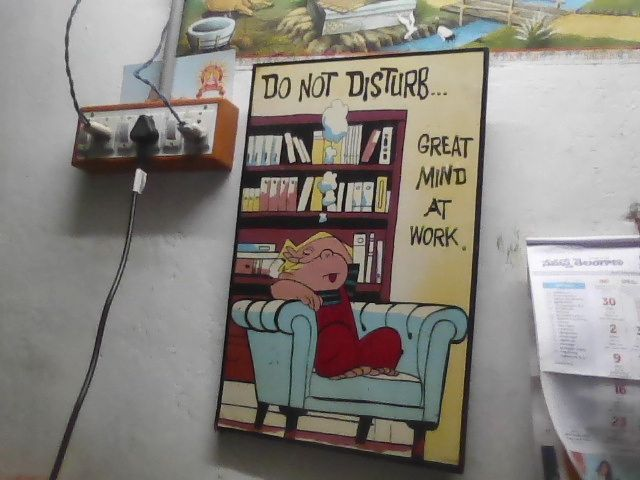

Grayscale Image:


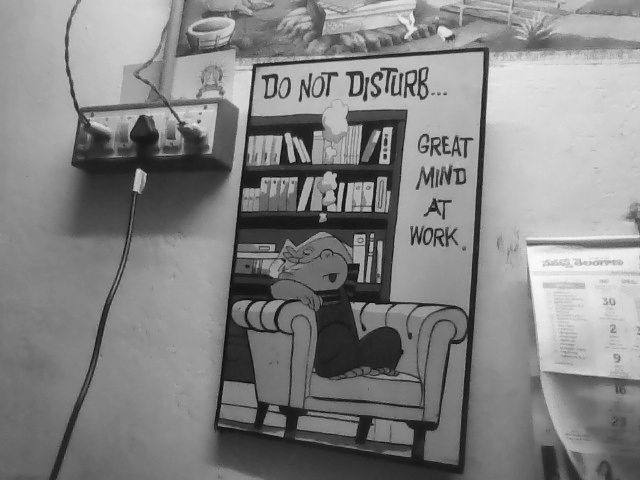

No faces detected.


In [ ]:
import cv2
import numpy as np
import librosa
from IPython.display import Audio, display, HTML
from google.colab.patches import cv2_imshow
from pydub import AudioSegment
from keras.models import load_model
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

# Load the model and face detector
model = load_model('model_file.h5')
faceDetect = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

labels_dict = {0: 'Angry', 1: 'Disgust', 2: 'Fear', 3: 'Happy', 4: 'Neutral', 5: 'Sad', 6: 'Surprise'}

supportive_texts = {
    'Angry': 'Breathe in calmness, breathe out anger 😌',
    'Disgust': 'Let go of what bothers you, and make room for joy! 🌈',
    'Fear': 'Face your fears, and they will disappear 💪',
    'Happy': 'Smile, and the world smiles with you 😊',
    'Neutral': 'Life is a canvas, paint it with positivity 🎨',
    'Sad': 'Better days are ahead, and they start with a new sunrise ☀️',
    'Surprise': 'Life is full of surprises, embrace them with joy! 🎉'
}

def play_audio(audio_file):
    audio_data, sr = librosa.load(audio_file)
    audio_obj = Audio(audio_data, rate=sr)
    display(audio_obj)

def get_audio_file(emotion):
    audio_files = {
        'Angry': '/content/Anger_audio.mpeg',
        'Disgust': '/content/Disgust_audio.mpeg',
        'Fear': '/content/Fear_audio.mpeg',
        'Happy': '/content/Happy_audio.mpeg',
        'Neutral': '/content/Neutral_audio.mpeg',
        'Sad': '/content/Sad_audio.mpeg',
        'Surprise': '/content/Surprise_audio.mpeg'
    }
    return audio_files[emotion]

def take_photo(filename='photo.jpg', quality=0.8):
    js = Javascript('''
      async function takePhoto(quality) {
        const div = document.createElement('div');
        const capture = document.createElement('button');
        capture.textContent = 'Capture';
        div.appendChild(capture);

        const video = document.createElement('video');
        video.style.display = 'block';
        const stream = await navigator.mediaDevices.getUserMedia({video: true});

        document.body.appendChild(div);
        div.appendChild(video);
        video.srcObject = stream;
        await video.play();

        google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

        await new Promise((resolve) => capture.onclick = resolve);

        const canvas = document.createElement('canvas');
        canvas.width = video.videoWidth;
        canvas.height = video.videoHeight;
        canvas.getContext('2d').drawImage(video, 0, 0);
        stream.getVideoTracks()[0].stop();
        div.remove();
        return canvas.toDataURL('image/jpeg', quality);
      }
    ''')
    display(js)
    data = eval_js('takePhoto({})'.format(quality))
    binary = b64decode(data.split(',')[1])
    with open(filename, 'wb') as f:
        f.write(binary)
    return filename

# Capture photo from webcam
try:
    filename = take_photo()
    print('Saved to {}'.format(filename))

    # Show the image which was just taken.
    img = cv2.imread(filename)
    print("Loaded Image:")
    cv2_imshow(img)

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    print("Grayscale Image:")
    cv2_imshow(gray)

    # Detect faces
    faces = faceDetect.detectMultiScale(gray, 1.3, 3)

    if len(faces) > 0:
        print(f"Detected faces: {faces}")
        for (x, y, w, h) in faces:
            sub_face_img = gray[y:y+h, x:x+w]
            resized = cv2.resize(sub_face_img, (48, 48))
            print("Resized Face Image:")
            cv2_imshow(resized)

            normalize = resized / 255.0
            reshaped = np.reshape(normalize, (1, 48, 48, 1))
            result = model.predict(reshaped)
            label = np.argmax(result, axis=1)[0]
            label_name = labels_dict[label]

            # Draw rectangles and text on the frame
            cv2.rectangle(img, (x, y), (x+w, y+h), (0, 0, 255), 3)  # Outer rectangle
            cv2.rectangle(img, (x, y), (x+w, y+h), (50, 50, 255), 2)  # Inner rectangle
            cv2.rectangle(img, (x, y-40), (x+w, y), (50, 50, 255), -1)  # Background for label
            cv2.putText(img, label_name, (x + 5, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

            # Display the predicted class label
            print(f"Predicted Emotion: {label_name} ({label})")

            # Display the output image
            cv2_imshow(img)

            # Convert audio file from .mpeg to .wav
            audio_file_path = get_audio_file(label_name)
            output_audio_path = f'/content/{label_name}_audio.wav'
            audio = AudioSegment.from_file(audio_file_path)
            audio.export(output_audio_path, format='wav')
            print(f"Converted {audio_file_path} to {output_audio_path}")

            # Load and play the converted audio
            play_audio(output_audio_path)

            # Display supportive text
            display(HTML(f"<span style='font-family: Comic Sans MS; font-size: 24px; color: cyan'>{supportive_texts[label_name]}</span>"))
    else:
        print("No faces detected.")
except Exception as err:
    print(str(err))

In [ ]:
from IPython.display import display, Javascript, Audio, HTML
from google.colab.output import eval_js
from base64 import b64decode
import cv2
import numpy as np
import librosa
from keras.models import load_model
from google.colab.patches import cv2_imshow

# Load the model and face detector
model = load_model('model_file.h5')
faceDetect = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

labels_dict = {0: 'Angry', 1: 'Disgust', 2: 'Fear', 3: 'Happy', 4: 'Neutral', 5: 'Sad', 6: 'Surprise'}

supportive_texts = {
    'Angry': 'Breathe in calmness, breathe out anger 😌',
    'Disgust': 'Let go of what bothers you, and make room for joy! 🌈',
    'Fear': 'Face your fears, and they will disappear 💪',
    'Happy': 'Smile, and the world smiles with you 😊',
    'Neutral': 'Life is a canvas, paint it with positivity 🎨',
    'Sad': 'Better days are ahead, and they start with a new sunrise ☀️',
    'Surprise': 'Life is full of surprises, embrace them with joy! 🎉'
}

def take_photo(filename='photo.jpg', quality=0.8):
    js = Javascript('''
        async function takePhoto(quality) {
            const div = document.createElement('div');
            const capture = document.createElement('button');
            capture.textContent = 'Capture';
            div.appendChild(capture);

            const video = document.createElement('video');
            video.style.display = 'block';
            const stream = await navigator.mediaDevices.getUserMedia({video: true});

            document.body.appendChild(div);
            div.appendChild(video);
            video.srcObject = stream;
            await video.play();

            // Resize the output to fit the video element.
            google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

            // Wait for Capture to be clicked.
            await new Promise((resolve) => capture.onclick = resolve);

            const canvas = document.createElement('canvas');
            canvas.width = video.videoWidth;
            canvas.height = video.videoHeight;
            canvas.getContext('2d').drawImage(video, 0, 0);
            stream.getVideoTracks()[0].stop();
            div.remove();
            return canvas.toDataURL('image/jpeg', quality);
        }
    ''')
    display(js)
    data = eval_js('takePhoto({})'.format(quality))
    binary = b64decode(data.split(',')[1])
    with open(filename, 'wb') as f:
        f.write(binary)
    return filename

def play_audio(audio_file):
    audio_data, sr = librosa.load(audio_file)
    audio_obj = Audio(audio_data, rate=sr)
    display(audio_obj)  # Explicitly display the Audio object

def get_audio_file(emotion):
    audio_files = {
        'Angry': '/content/Anger.mpeg',
        'Disgust': '/content/Disgust.mpeg',
        'Fear': '/content/Fear.mpeg',
        'Happy': '/content/Happy.mpeg',
        'Neutral': '/content/Neutral.mpeg',
        'Sad': '/content/Sad.mpeg',
        'Surprise': '/content/Surprise.mpeg'
    }
    return audio_files[emotion]

def predict_emotion_and_respond(image_path):
    # Read the image
    frame = cv2.imread(image_path)

    if frame is None:
        print("Failed to load image.")
        return

    # Show the loaded image
    print("Loaded image:")
    cv2_imshow(frame)

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Show the grayscale image
    print("Grayscale image:")
    cv2_imshow(gray)

    faces = faceDetect.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30), flags=cv2.CASCADE_SCALE_IMAGE)

    if len(faces) == 0:
        print("No faces detected.")
        return

    print(f"Detected faces: {faces}")

    for (x, y, w, h) in faces:
        sub_face_img = gray[y:y+h, x:x+w]
        resized = cv2.resize(sub_face_img, (48, 48))

        # Show the resized face image
        print("Resized face image:")
        cv2_imshow(resized)

        normalize = resized / 255.0
        reshaped = np.reshape(normalize, (1, 48, 48, 1))

        try:
            result = model.predict(reshaped)
            label = np.argmax(result, axis=1)[0]
            label_name = labels_dict[label]

            # Print the label name and index
            print(f"Label: {label_name} ({label})")

            # Draw rectangles and text on the frame
            cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 0, 255), 1)
            cv2.rectangle(frame, (x, y), (x+w, y+h), (50, 50, 255), 2)
            cv2.rectangle(frame, (x, y-40), (x+w, y), (50, 50, 255), -1)
            cv2.putText(frame, labels_dict[label], (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

            # Play an audio file based on the predicted emotion
            audio_file = get_audio_file(label_name)
            play_audio(audio_file)

            # Display supportive text
            display(HTML(f"<span style='font-family: Comic Sans MS; font-size: 24px; color: cyan'>{supportive_texts[label_name]}</span>"))

        except Exception as e:
            print("Error during prediction or response:", str(e))

    # Display the output image with a limited size
    output_width = 350  # Adjust the width as needed
    output_height = 350  # Adjust the height as needed
    resized_frame = cv2.resize(frame, (output_width, output_height))
    cv2_imshow(resized_frame)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

try:
    filename = take_photo()
    print('Saved to {}'.format(filename))

    # Predict emotion and respond
    predict_emotion_and_respond(filename)
except Exception as err:
    # Errors will be thrown if the user does not have a webcam or if they do not
    # grant the page permission to access it.
    print(str(err))


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
from IPython.display import display, Javascript, Audio, HTML
from google.colab.output import eval_js
from base64 import b64decode
import cv2
import numpy as np
import librosa
from keras.models import load_model
from google.colab.patches import cv2_imshow

# Load the model and face detector
model = load_model('model_file.h5')
faceDetect = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

labels_dict = {0: 'Angry', 1: 'Disgust', 2: 'Fear', 3: 'Happy', 4: 'Neutral', 5: 'Sad', 6: 'Surprise'}

supportive_texts = {
    'Angry': 'Breathe in calmness, breathe out anger 😌',
    'Disgust': 'Let go of what bothers you, and make room for joy! 🌈',
    'Fear': 'Face your fears, and they will disappear 💪',
    'Happy': 'Smile, and the world smiles with you 😊',
    'Neutral': 'Life is a canvas, paint it with positivity 🎨',
    'Sad': 'Better days are ahead, and they start with a new sunrise ☀️',
    'Surprise': 'Life is full of surprises, embrace them with joy! 🎉'
}

def take_photo(filename='photo.jpg', quality=0.8):
    js = Javascript('''
        async function takePhoto(quality) {
            const div = document.createElement('div');
            const capture = document.createElement('button');
            capture.textContent = 'Capture';
            div.appendChild(capture);

            const video = document.createElement('video');
            video.style.display = 'block';
            const stream = await navigator.mediaDevices.getUserMedia({video: true});

            document.body.appendChild(div);
            div.appendChild(video);
            video.srcObject = stream;
            await video.play();

            // Resize the output to fit the video element.
            google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

            // Wait for Capture to be clicked.
            await new Promise((resolve) => capture.onclick = resolve);

            const canvas = document.createElement('canvas');
            canvas.width = video.videoWidth;
            canvas.height = video.videoHeight;
            canvas.getContext('2d').drawImage(video, 0, 0);
            stream.getVideoTracks()[0].stop();
            div.remove();
            return canvas.toDataURL('image/jpeg', quality);
        }
    ''')
    display(js)
    data = eval_js('takePhoto({})'.format(quality))
    binary = b64decode(data.split(',')[1])
    with open(filename, 'wb') as f:
        f.write(binary)
    return filename

def play_audio(audio_file):
    audio_data, sr = librosa.load(audio_file)
    audio_obj = Audio(audio_data, rate=sr)
    display(audio_obj)  # Explicitly display the Audio object

def get_audio_file(emotion):
    audio_files = {
        'Angry': '/content/Anger.mpeg',
        'Disgust': '/content/Disgust.mpeg',
        'Fear': '/content/Fear.mpeg',
        'Happy': '/content/Happy.mpeg',
        'Neutral': '/content/Neutral.mpeg',
        'Sad': '/content/Sad.mpeg',
        'Surprise': '/content/Surprise.mpeg'
    }
    return audio_files[emotion]

def predict_emotion_and_respond(image_path):
    # Read the image
    frame = cv2.imread(image_path)

    if frame is None:
        print("Failed to load image.")
        return

    # Show the loaded image
    print("Loaded image:")
    cv2_imshow(frame)

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Show the grayscale image
    print("Grayscale image:")
    cv2_imshow(gray)

    faces = faceDetect.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30), flags=cv2.CASCADE_SCALE_IMAGE)

    if len(faces) == 0:
        print("No faces detected.")
        return

    print(f"Detected faces: {faces}")

    for (x, y, w, h) in faces:
        sub_face_img = gray[y:y+h, x:x+w]
        resized = cv2.resize(sub_face_img, (48, 48))

        # Show the resized face image
        print("Resized face image:")
        cv2_imshow(resized)

        normalize = resized / 255.0
        reshaped = np.reshape(normalize, (1, 48, 48, 1))

        try:
            result = model.predict(reshaped)
            label = np.argmax(result, axis=1)[0]
            label_name = labels_dict[label]

            # Print the label name and index
            print(f"Label: {label_name} ({label})")

            # Draw rectangles and text on the frame
            cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 0, 255), 1)
            cv2.rectangle(frame, (x, y), (x+w, y+h), (50, 50, 255), 2)
            cv2.rectangle(frame, (x, y-40), (x+w, y), (50, 50, 255), -1)
            cv2.putText(frame, labels_dict[label], (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

            # Play an audio file based on the predicted emotion
            audio_file = get_audio_file(label_name)
            play_audio(audio_file)

            # Display supportive text
            display(HTML(f"<span style='font-family: Comic Sans MS; font-size: 24px; color: cyan'>{supportive_texts[label_name]}</span>"))

        except Exception as e:
            print("Error during prediction or response:", str(e))

    # Display the output image with a limited size
    output_width = 350  # Adjust the width as needed
    output_height = 350  # Adjust the height as needed
    resized_frame = cv2.resize(frame, (output_width, output_height))
    cv2_imshow(resized_frame)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

try:
    filename = take_photo()
    print('Saved to {}'.format(filename))

    # Predict emotion and respond
    predict_emotion_and_respond(filename)
except Exception as err:
    # Errors will be thrown if the user does not have a webcam or if they do not
    # grant the page permission to access it.
    print(str(err))

Output hidden; open in https://colab.research.google.com to view.